In [1]:
from diffCherenkov.tools.visualization import create_detector_comparison_display
from tools.geometry import generate_detector
from tools.utils import load_single_event, save_single_event, print_params, generate_random_params
from tools.losses import compute_loss_with_time, compute_simplified_loss
from tools.simulation import setup_event_simulator
from tools.optimization import get_initial_guess

import jax
import jax.numpy as jnp
import time

from jax import jit

# uncomment to run on CPU
# jax.config.update('jax_platform_name', 'cpu')

In [2]:
default_json_filename = 'config/cyl_geom_config.json'

detector = generate_detector(default_json_filename)
detector_points = jnp.array(detector.all_points)
detector_radius = detector.S_radius
NUM_DETECTORS = len(detector_points)
Nphot = 500_000

In [3]:
# Set data temperature as None for no smoothing
temperature = None

# Temperature for simulation
sim_temperatures = [0.1, 0.5, 1.0]

event_simulators = {
    sim_temperatures[i]: setup_event_simulator(
        default_json_filename,
        Nphot,
        sim_temperatures[i],
        is_data=True
    )
    for i in range(len(sim_temperatures))
}

temperature_sim = 0.5

simulate_true_data = setup_event_simulator(default_json_filename, Nphot, temperature, is_data=True)
simulate_event = event_simulators[temperature_sim]

In [4]:
# Generate and save a single event
key = jax.random.PRNGKey(9878099990)

# Sample true parameter configurations:

# # cone on the wall
# true_params = (
#     jnp.array(700.0),  # energy
#     jnp.array([0.5, 0.0, -0.5]),  # position
#     jnp.array([1.0, -1.0, 0.2]),  # direction
# )

# Generate random parameters
true_params = generate_random_params(key)

single_event_data = simulate_true_data(true_params, key)

total_charge = jnp.sum(single_event_data[0])
print("Total charge:", total_charge)

save_single_event(single_event_data, true_params, filename='events/test_event_data.h5')

Total charge: 8177.4844


'events/test_event_data.h5'

Event Parameters:
────────────────────
Energy: 394.49 MeV
Initial Position: (0.21, 0.04, 0.87)
Initial Direction: (-0.11, -0.82, -0.56)
────────────────────


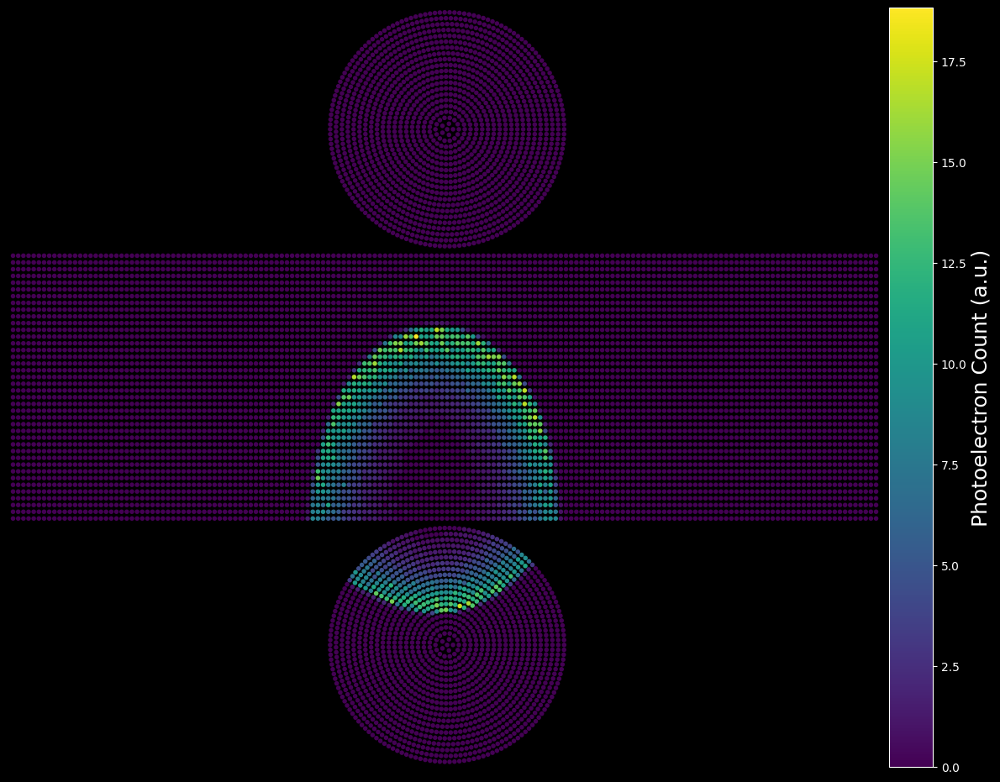

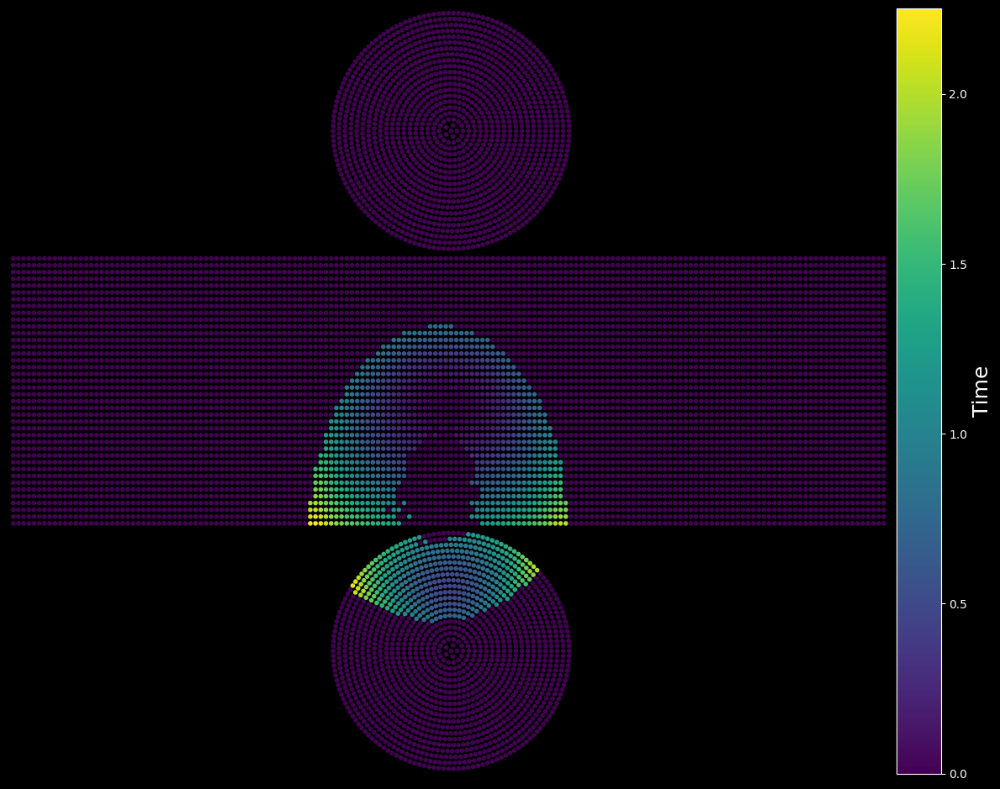

In [5]:
from tools.visualization import create_detector_display
event_location = 'events/test_event_data.h5'
loaded_params, loaded_indices, loaded_charges, loaded_times = load_single_event(event_location, NUM_DETECTORS)
print_params(loaded_params)

detector_display = create_detector_display()
detector_display(loaded_indices, loaded_charges, loaded_times, file_name='event_display.png', plot_time=False)
detector_display(loaded_indices, loaded_charges, loaded_times, file_name='event_display.png', plot_time=True)

In [6]:
from tools.visualization import create_detector_display
event_location = 'events/test_event_data.h5'
loaded_params, loaded_charges, loaded_times = load_single_event(event_location, NUM_DETECTORS, sparse=False)
print_params(loaded_params)

guess = get_initial_guess(loaded_charges, detector_points, key = key)
print_params(guess)

# simulate event with guess
charges, times = simulate_event(guess, key)

Event Parameters:
────────────────────
Energy: 394.49 MeV
Initial Position: (0.21, 0.04, 0.87)
Initial Direction: (-0.11, -0.82, -0.56)
────────────────────
Event Parameters:
────────────────────
Energy: 387.29 MeV
Initial Position: (0.24, 0.10, -0.49)
Initial Direction: (-0.13, -0.96, -0.26)
────────────────────


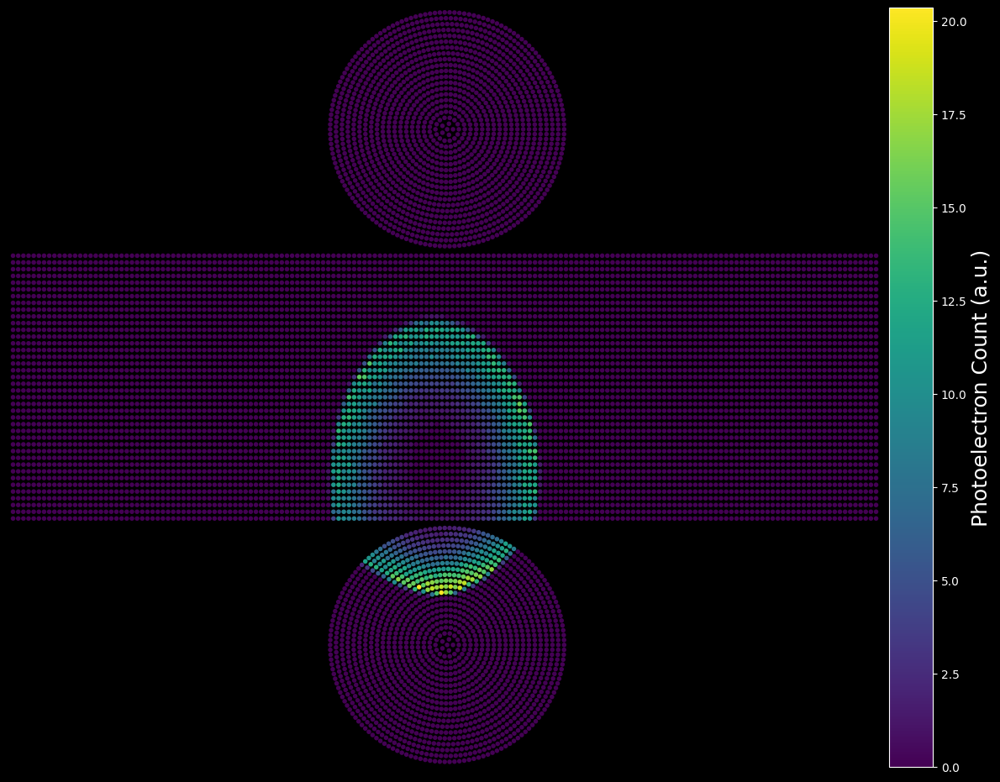

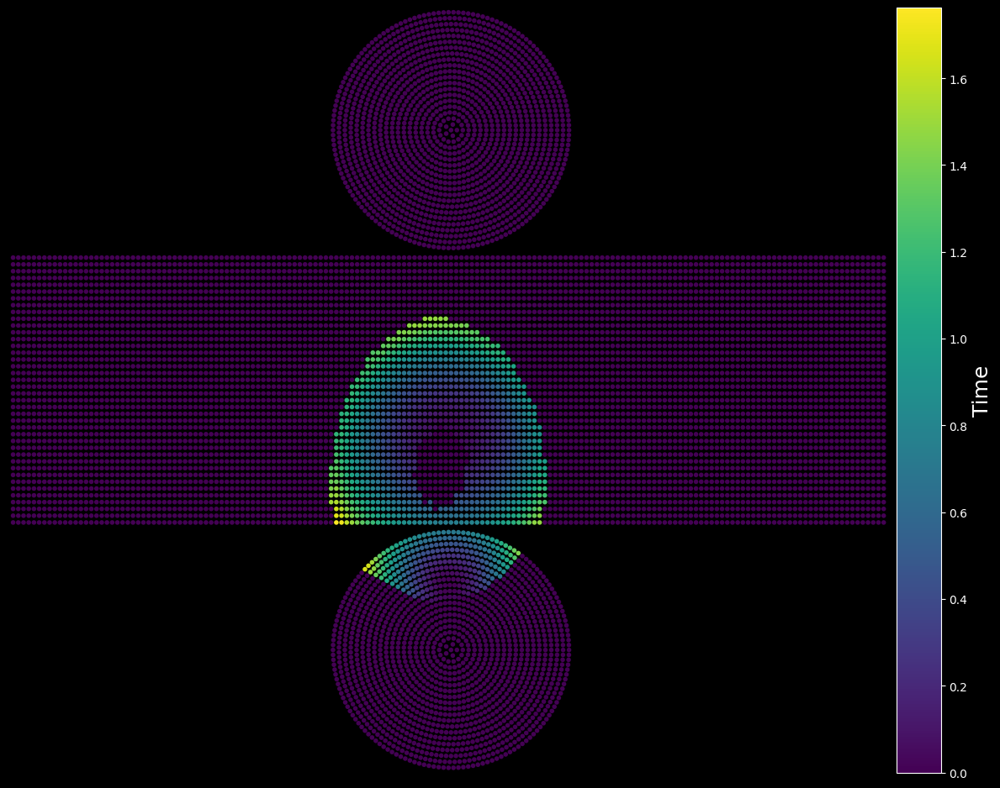

In [7]:
# plot guess
detector_display = create_detector_display(sparse=False)
detector_display(charges, times, file_name='event_display.png', plot_time=False)
detector_display(charges, times, file_name='event_display.png', plot_time=True)

100%|██████████| 1000/1000 [00:45<00:00, 21.86it/s]


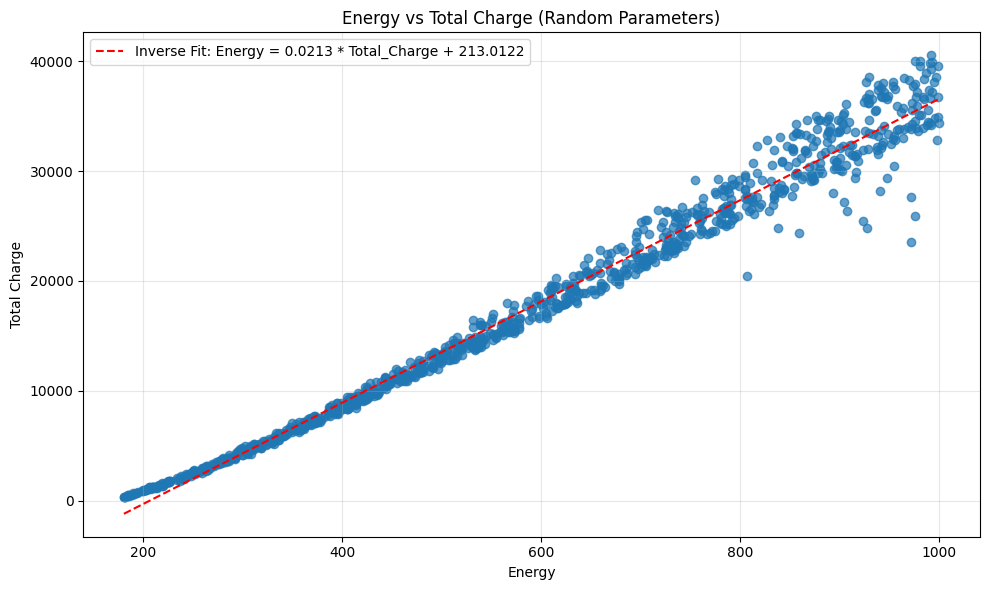

Inverse slope: 0.0213, Intercept: 213.0122


In [8]:
import jax
import jax.numpy as jnp
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

# Number of random parameter sets to generate
num_samples = 1000

# Initialize arrays to store results
all_energies = []
all_charges = []

# Main key for random generation
master_key = jax.random.PRNGKey(42)

# Generate random parameters and run simulations
for i in tqdm(range(num_samples)):
    # Generate a unique key for this simulation
    master_key, sim_key = jax.random.split(master_key)

    # Generate random parameters
    params = generate_random_params(sim_key)

    # Run simulation
    charges, times = simulate_true_data(params, sim_key)

    # Extract energy and calculate total charge
    energy = float(params[0])  # Energy is the first parameter
    total_charge = float(jnp.sum(charges))

    # Store results
    all_energies.append(energy)
    all_charges.append(total_charge)

# Convert to numpy arrays for plotting
all_energies = np.array(all_energies)
all_charges = np.array(all_charges)

# Create scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(all_energies, all_charges, alpha=0.7)
plt.xlabel('Energy')
plt.ylabel('Total Charge')
plt.title('Energy vs Total Charge (Random Parameters)')
plt.grid(True, alpha=0.3)

# Add trend line
z = np.polyfit(all_energies, all_charges, 1)
z_inverse = np.polyfit(all_charges, all_energies, 1)
p = np.poly1d(z)
plt.plot(np.sort(all_energies), p(np.sort(all_energies)), "r--",
         label=f'Inverse Fit: Energy = {z_inverse[0]:.4f} * Total_Charge + {z_inverse[1]:.4f}')
plt.legend()

plt.tight_layout()
plt.show()

z_inv_slope, z_inv_intercept = z_inverse

# Use these values for get_initial_guess
print(f"Inverse slope: {z_inv_slope:.4f}, Intercept: {z_inv_intercept:.4f}")

In [8]:
import jax
import jax.numpy as jnp
from jax import random, jit, value_and_grad
import matplotlib.pyplot as plt
from tqdm import tqdm
from tools.losses import compute_softmin_loss

def interpolate_params(true_params, guess_params, t):
    """Interpolate between parameters linearly."""
    return tuple(a + t * (b - a) for a, b in zip(guess_params, true_params))

def compute_gradients_for_path(true_params, guess_params, key, simulate_event, simulate_true_data, detector_points, t_values):
    """Compute gradients along interpolation path."""
    
    # Get simulated "data" once for true parameters
    true_data = simulate_true_data(true_params, key)
    
    # Create value_and_grad function for the loss
    loss_value_and_grad = value_and_grad(
        lambda params, k: compute_simplified_loss(
            detector_points,
            *true_data,
            *simulate_event(params, k)
        ),
    )
    
    grad_norms = {
        'energy': [],
        'position': [],
        'direction': []
    }

    # Generate subkeys for each point
    keys = random.split(key, len(t_values))

    for t, subkey in zip(t_values, keys):
        params = interpolate_params(true_params, guess_params, t)
        _, grads = loss_value_and_grad(params, subkey)

        # Store gradient norms
        grad_norms['energy'].append(jnp.linalg.norm(grads[0]))
        grad_norms['position'].append(jnp.linalg.norm(grads[1]))
        grad_norms['direction'].append(jnp.linalg.norm(grads[2]))
    
    # Convert lists to arrays
    return {k: jnp.array(v) for k, v in grad_norms.items()}

def analyze_gradient_distribution(detector_points, simulate_event, simulate_true_data, K=100, n_points=10):
    """Run K trials of gradient analysis."""
    master_key = random.PRNGKey(42)
    t_values = jnp.linspace(0, 1, n_points)

    # Storage for all gradient magnitudes
    all_grads = {
        'energy': [],
        'position': [],
        'direction': []
    }

    for k in tqdm(range(K)):
        # Split keys for different random operations
        key1, key2, key3, master_key = random.split(master_key, 4)

        # Generate true parameters and guess
        true_params = generate_random_params(key1)
        guess_params = generate_random_params(key2)

        # Compute gradients along path
        grad_norms = compute_gradients_for_path(
            true_params,
            guess_params,
            key3,
            simulate_event,
            simulate_true_data,
            detector_points,
            t_values
        )

        # Store results
        for param in grad_norms:
            all_grads[param].append(grad_norms[param])

    # Convert lists to arrays
    for param in all_grads:
        all_grads[param] = jnp.concatenate(all_grads[param])

    return all_grads

100%|██████████| 500/500 [03:14<00:00,  2.58it/s]


# Gradient scales from analysis
gradient_scales = {
    'energy': 2.408e+02,
    'position': 1.282e+00,
    'direction': 2.722e-01,
}


/tmp/ipykernel_498563/3124189741.py:93: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust for suptitle


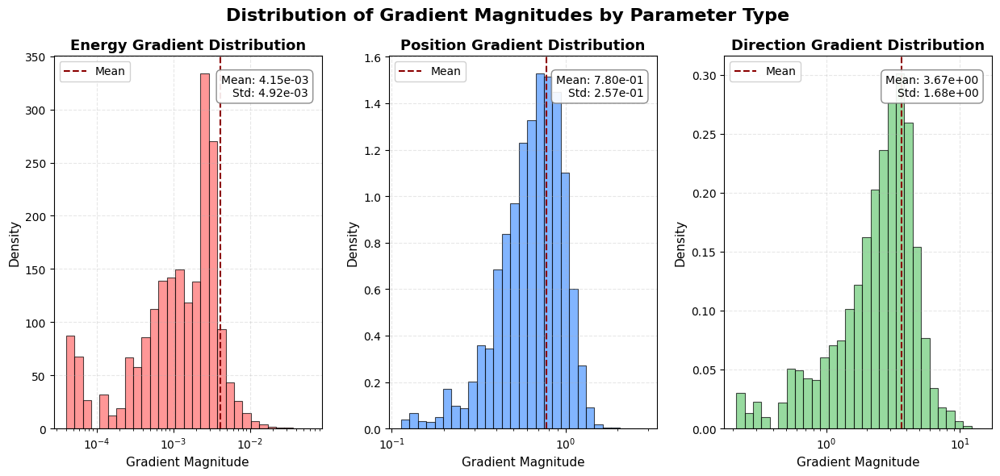

In [10]:
def analyze_gradient_scales(detector_points, simulate_event, simulate_true_data, 
                          K=100, n_points=10, temperature_sim=0.5,
                          plot=True, save_plot=False):
    """
    Analyze gradient distributions and return scaling factors.
    Returns scaling factors in the format {'energy': X, 'position': Y, ...}
    """
    # Get gradient data
    all_grads = analyze_gradient_distribution(
        detector_points,
        simulate_event,
        simulate_true_data,
        K=K,
        n_points=n_points
    )

    # Compute scaling factors
    gradient_scales = {}
    for param, grads in all_grads.items():
        grads = jnp.array(grads)
        mean = jnp.mean(jnp.abs(grads))
        gradient_scales[param] = 1.0 / mean if mean != 0 else 1.0

    # Print in specified format
    print("# Gradient scales from analysis")
    print("gradient_scales = {")
    for param, factor in gradient_scales.items():
        print(f"    '{param}': {factor:2.3e},")
    print("}")

    if plot:
        # Create figure with better proportions
        fig = plt.figure(figsize=(15, 6))

        # Better color scheme for readability
        colors = {
            'energy': '#FF6B6B',  # Brighter red
            'position': '#4D96FF', # Brighter blue
            'direction': '#6BCB77'  # Brighter green
        }

        # Create subplot grid with better spacing
        gs = fig.add_gridspec(1, 3, wspace=0.25)

        for i, (param, grads) in enumerate(all_grads.items()):
            ax = fig.add_subplot(gs[0, i])
            grads_array = jnp.array(grads)

            # Calculate bins
            min_val = jnp.log10(jnp.min(grads_array))
            max_val = jnp.log10(jnp.max(grads_array))
            bins = jnp.logspace(min_val, max_val, 30)

            # Plot histogram with improved styling
            counts, bins, _ = ax.hist(grads_array, bins=bins, density=True,
                                    alpha=0.7, color=colors[param],
                                    edgecolor='black', linewidth=0.8)

            # Customize plot with improved typography and layout
            ax.set_xscale('log')
            ax.set_title(f'{param.capitalize()} Gradient Distribution',
                        fontsize=13, fontweight='bold')
            ax.set_xlabel('Gradient Magnitude', fontsize=11)
            ax.set_ylabel('Density', fontsize=11)
            ax.grid(True, alpha=0.3, linestyle='--')

            # Format tick labels for better readability
            ax.tick_params(axis='both', which='major', labelsize=10)
            ax.tick_params(axis='both', which='minor', labelsize=8)

            # Add statistics with improved formatting
            mean = jnp.mean(grads_array)
            std = jnp.std(grads_array)
            stats_text = f'Mean: {mean:.2e}\nStd: {std:.2e}'
            ax.text(0.95, 0.95, stats_text,
                    transform=ax.transAxes,
                    verticalalignment='top',
                    horizontalalignment='right',
                    bbox=dict(facecolor='white', alpha=0.9, edgecolor='gray', boxstyle='round,pad=0.4'),
                    fontsize=10)

            # Add mean line with better visibility
            ax.axvline(mean, color='darkred', linestyle='--', linewidth=1.5, label='Mean')

            # Place legend in a better position
            ax.legend(loc='upper left', framealpha=0.9)

        # Add overall title with better placement
        fig.suptitle('Distribution of Gradient Magnitudes by Parameter Type',
                     fontsize=16, fontweight='bold', y=0.98)

        # Ensure proper layout
        plt.tight_layout(rect=[0, 0, 1, 0.95])  # Adjust for suptitle
        
        if save_plot:
            plt.savefig('gradient_distributions.png', bbox_inches='tight', dpi=300)
        else:
            plt.show()
        plt.close()
    
    return gradient_scales

# Example usage:
if __name__ == "__main__":
    detector = generate_detector(default_json_filename)
    detector_points = jnp.array(detector.all_points)

    temperature_sim = 0.5

    simulate_event = event_simulators[temperature_sim]
    
    gradient_scales = analyze_gradient_scales(
        detector_points=detector_points,
        simulate_event=simulate_event,
        simulate_true_data=simulate_true_data,
        K=500,
        n_points=4,
        plot=True,
        save_plot=False
    )

Event Parameters:
────────────────────
Energy: 700.90 MeV
Initial Position: (-0.46, -0.20, 0.55)
Initial Direction: (0.48, 0.20, -0.86)
────────────────────
Event Parameters:
────────────────────
Energy: 662.15 MeV
Initial Position: (0.18, 0.36, -0.38)
Initial Direction: (0.51, 0.14, -0.85)
────────────────────


2025-03-16 23:51:19.974720: W external/xla/xla/hlo/transforms/host_offloader.cc:372] Token parameters are not supported for streaming.


Step: 0, Loss: 0.4537162184715271, LR: 0.0010000000474974513
Step: 100, Loss: 0.027123892679810524, LR: 0.009999999776482582
Step: 200, Loss: 0.020837295800447464, LR: 0.00549999950453639


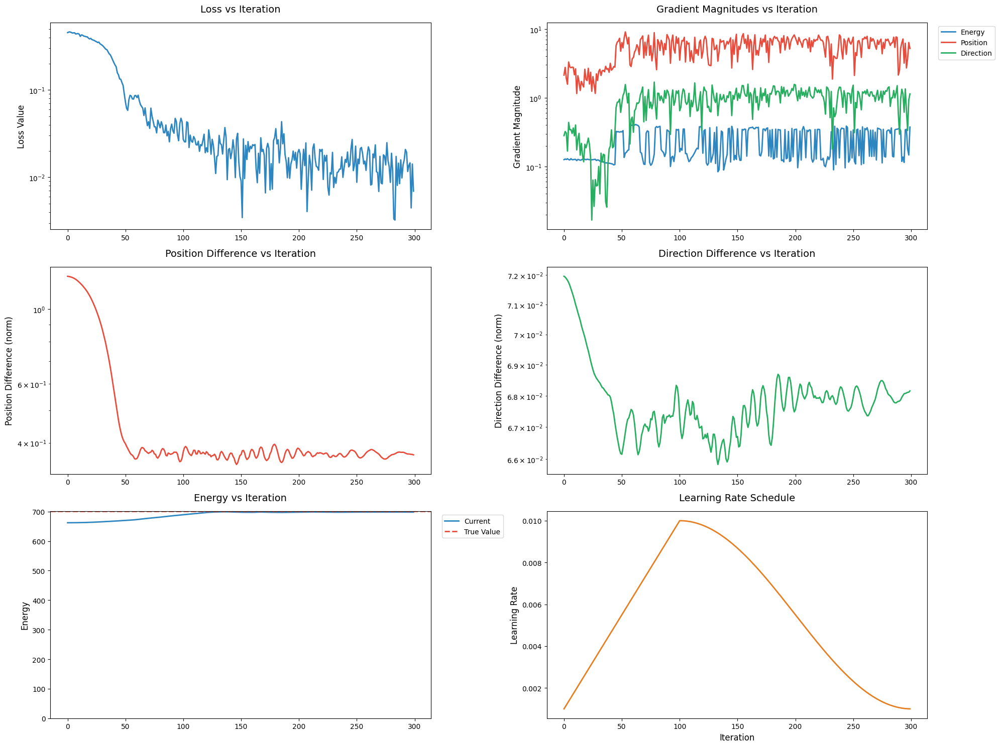

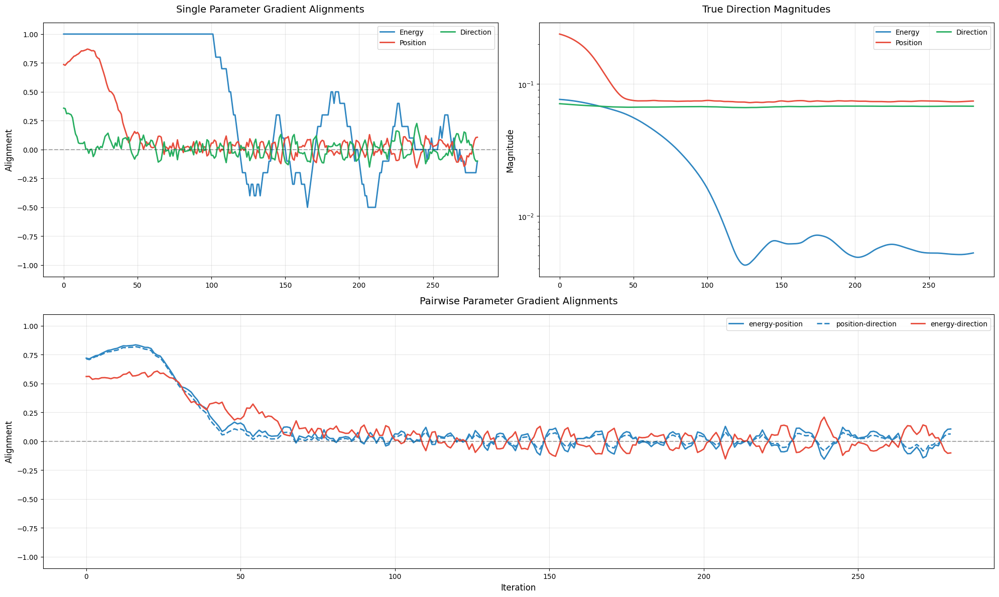

Simulated Event:


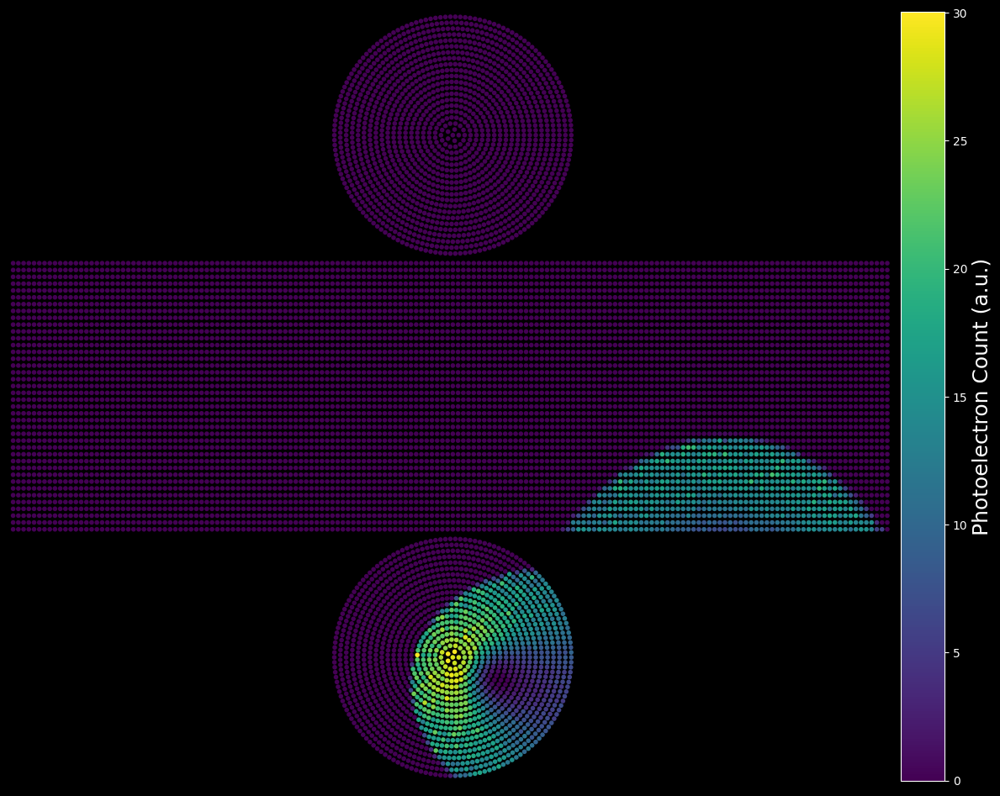

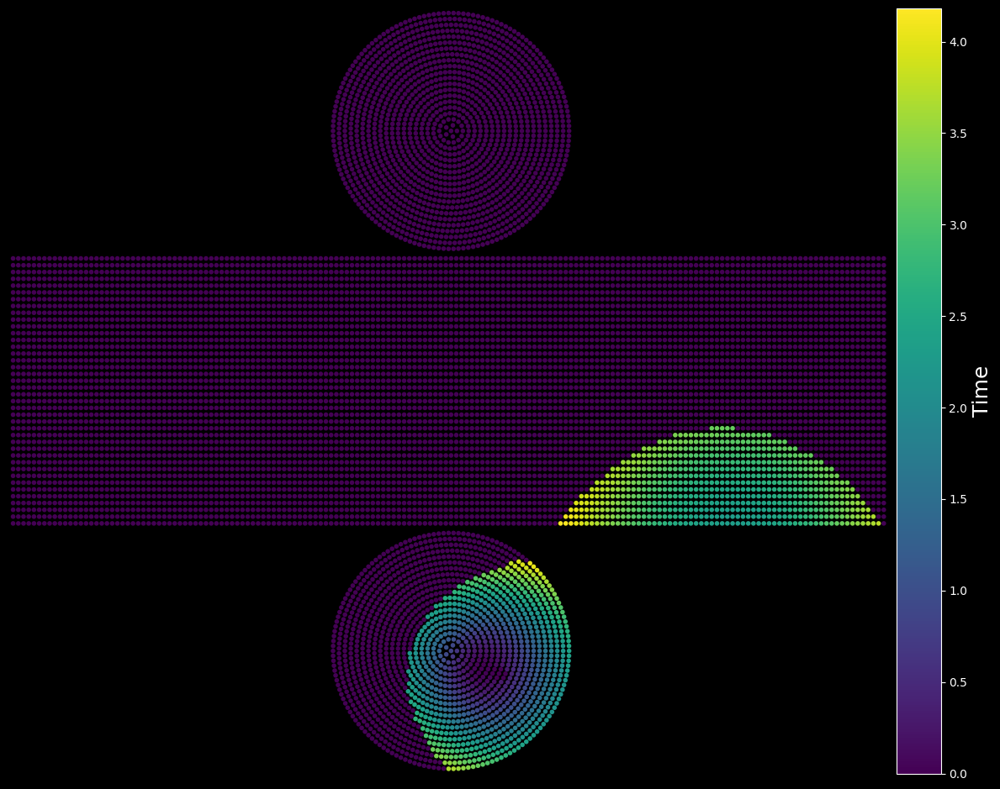

True Event:


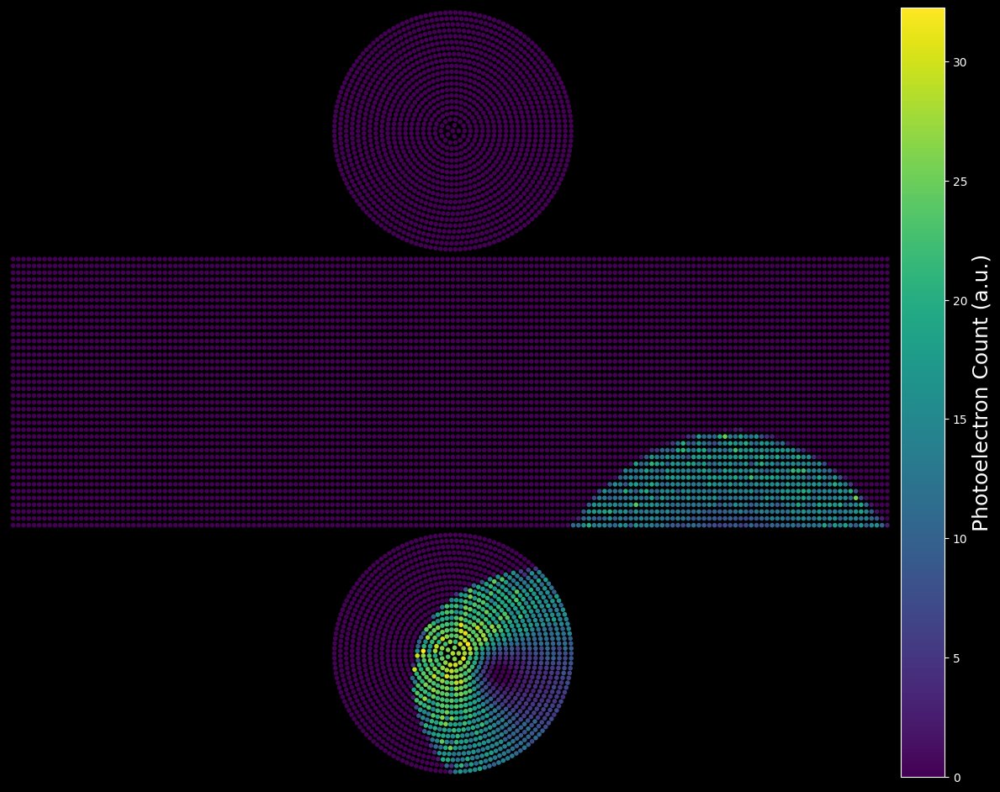

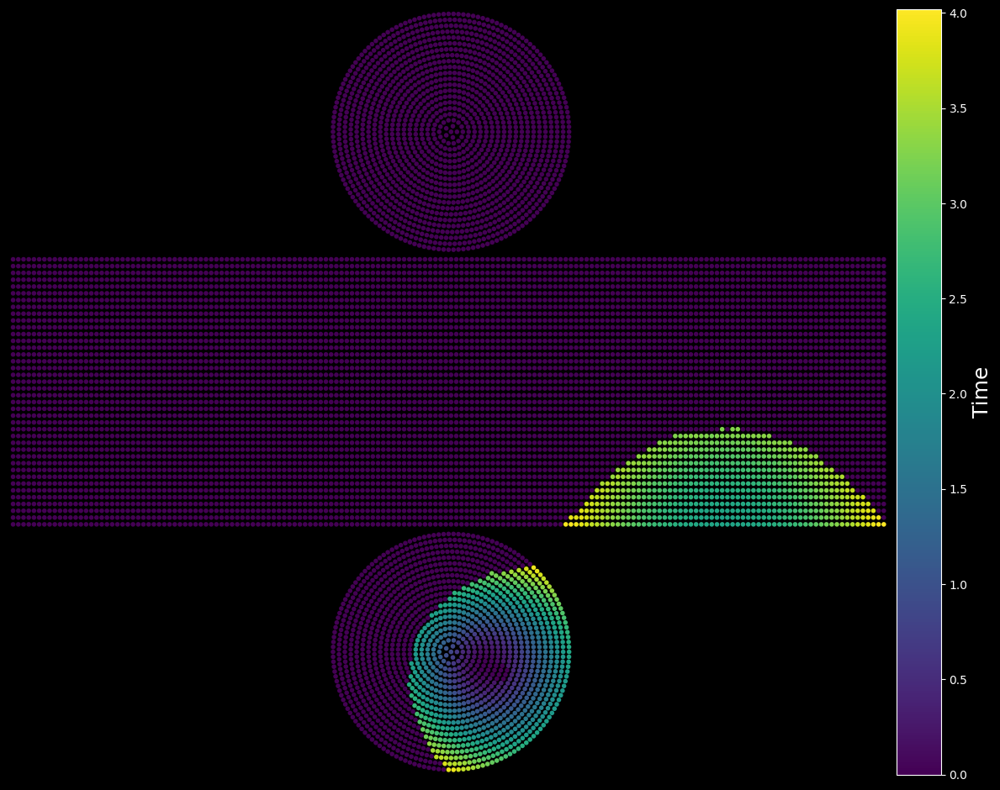

Final Parameters:
Event Parameters:
────────────────────
Energy: 698.13 MeV
Initial Position: (-0.56, 0.15, 0.59)
Initial Direction: (0.49, 0.13, -0.86)
────────────────────
True Parameters:
Event Parameters:
────────────────────
Energy: 700.90 MeV
Initial Position: (-0.46, -0.20, 0.55)
Initial Direction: (0.48, 0.20, -0.86)
────────────────────
Difference in Parameters:
Energy:  -2.7664185 MeV, Percent:  -0.39469475 %
Position:  0.36830553 , difference/pmt_radius:  9.207639
Direction:  0.068156935 , Angular:  3.905852  degrees


In [11]:
import jax
import jax.numpy as jnp
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from typing import Tuple, Dict, Any, NamedTuple
from tools.losses import compute_softmin_loss

from typing import Dict, NamedTuple, Tuple

# Define types for the scales
ScalesDict = Dict[str, float]

class OptimizationScales(NamedTuple):
    """Stores various scaling factors for optimization"""
    parameter_scales: ScalesDict
    gradient_scales: ScalesDict
    gradient_modifiers: ScalesDict

def create_default_scales() -> OptimizationScales:
    """Creates default optimization scales"""
    parameter_scales = {
        'energy': 500.0,
        'position': 5.0,
        'direction': 1.0
    }

    gradient_scales = {
        'energy': 2.408e+02,
        'position': 1.282e+00,
        'direction': 2.722e-01,
    }

    # Default modifiers are all 1.0
    gradient_modifiers = {
        'energy': 0.001,
        'position': 1.0,
        'direction': 1.0
    }

    return OptimizationScales(
        parameter_scales=parameter_scales,
        gradient_scales=gradient_scales,
        gradient_modifiers=gradient_modifiers
    )


@jax.jit
def compute_parameter_alignments(
    current_params: Tuple,
    true_params: Tuple,
    scaled_grads: Tuple,
    scales: OptimizationScales,
    eps: float = 1e-8
) -> Tuple[Dict[str, float], Dict[str, float], Dict[str, float]]:
    """Compute alignment between gradient descent direction and true direction

    Note: Gradient descent moves in -gradient direction, so we compare
    true_direction with -gradient
    """
    # Compute true directions (scaled appropriately)
    true_dirs = {
        'energy': (true_params[0] - current_params[0]) / scales.parameter_scales['energy'],
        'position': (true_params[1] - current_params[1]) / scales.parameter_scales['position'],
        'direction': true_params[2] - current_params[2]  # Already normalized
    }

    # Store true direction magnitudes
    magnitudes = {
        'energy': jnp.abs(true_dirs['energy']),
        'position': jnp.linalg.norm(true_dirs['position']),
        'direction': jnp.linalg.norm(true_dirs['direction'])
    }

    # Single parameter alignments
    single_alignments = {}

    # Scalar parameter (energy)
    true_dir = true_dirs['energy']
    grad = scaled_grads[0]
    # Compare with -gradient for correct alignment
    single_alignments['energy'] = jnp.sign(true_dir) * jnp.sign(-grad)

    # Vector parameters (position, direction)
    for name, idx in [('position', 1), ('direction', 2)]:
        true_dir = true_dirs[name]
        grad = scaled_grads[idx]
        true_norm = jnp.linalg.norm(true_dir) + eps
        grad_norm = jnp.linalg.norm(grad) + eps
        true_normalized = true_dir / true_norm
        grad_normalized = -grad / grad_norm  # Negative gradient for descent direction
        single_alignments[name] = jnp.sum(true_normalized * grad_normalized)

    # Pairwise alignments
    pair_alignments = {}
    param_names = ['energy', 'position', 'direction']

    for i, name1 in enumerate(param_names):
        for name2 in param_names[i+1:]:
            # Get true directions and gradients
            true_dir1 = jnp.ravel(true_dirs[name1])
            true_dir2 = jnp.ravel(true_dirs[name2])
            grad1 = jnp.ravel(scaled_grads[param_names.index(name1)])
            grad2 = jnp.ravel(scaled_grads[param_names.index(name2)])

            # Combine vectors
            true_combined = jnp.concatenate([true_dir1, true_dir2])
            grad_combined = -jnp.concatenate([grad1, grad2])  # Negative for descent direction

            # Normalize for pure directional measure
            true_norm = jnp.linalg.norm(true_combined) + eps
            grad_norm = jnp.linalg.norm(grad_combined) + eps
            alignment = jnp.sum((true_combined/true_norm) * (grad_combined/grad_norm))

            pair_alignments[f"{name1}_{name2}"] = alignment

    return single_alignments, pair_alignments, magnitudes

def smooth_data(data: np.ndarray, window: int = 10) -> np.ndarray:
    """Smooth data by taking rolling average

    Args:
        data: Input data array
        window: Size of smoothing window

    Returns:
        Smoothed data array
    """
    # Handle arrays of different shapes
    if len(data.shape) == 1:
        kernel = np.ones(window) / window
        return np.convolve(data, kernel, mode='valid')
    else:
        # For 2D arrays (e.g., position vectors)
        smoothed = np.zeros((len(data) - window + 1, data.shape[1]))
        for i in range(data.shape[1]):
            kernel = np.ones(window) / window
            smoothed[:, i] = np.convolve(data[:, i], kernel, mode='valid')
        return smoothed

def plot_alignment_history(history: Dict[str, Any], window: int = 10, figsize: Tuple[int, int] = (20, 12)):
    """Plot alignment history with improved layout and smoothing"""
    param_names = ['energy', 'position', 'direction']

    fig = plt.figure(figsize=figsize)
    gs = gridspec.GridSpec(2, 2, height_ratios=[1, 1])

    # 1. Single parameter alignments
    ax1 = fig.add_subplot(gs[0, 0])
    colors = ['#2E86C1', '#E74C3C', '#27AE60']
    for param, color in zip(param_names, colors):
        data = np.array(history['alignments']['single'][param])
        smoothed_data = smooth_data(data, window)
        x = np.arange(len(smoothed_data))
        ax1.plot(x, smoothed_data, label=param.capitalize(), color=color, linewidth=2)

    ax1.set_ylabel('Alignment', fontsize=12)
    ax1.set_title('Single Parameter Gradient Alignments', fontsize=14, pad=15)
    ax1.grid(True, alpha=0.3)
    ax1.axhline(y=0, color='k', linestyle='--', alpha=0.3)
    ax1.set_ylim(-1.1, 1.1)
    ax1.legend(fontsize=10, ncol=2)

    # 2. Magnitudes
    ax2 = fig.add_subplot(gs[0, 1])
    for param, color in zip(param_names, colors):
        data = np.array(history['alignments']['magnitudes'][param])
        smoothed_data = smooth_data(data, window)
        x = np.arange(len(smoothed_data))
        ax2.plot(x, smoothed_data, label=param.capitalize(), color=color, linewidth=2)

    ax2.set_ylabel('Magnitude', fontsize=12)
    ax2.set_title('True Direction Magnitudes', fontsize=14, pad=15)
    ax2.set_yscale('log')
    ax2.grid(True, alpha=0.3)
    ax2.legend(fontsize=10, ncol=2)

    # 3. Pairwise alignments - split into two groups for clarity
    ax3 = fig.add_subplot(gs[1, :])
    # Group 1: Position-related pairs
    position_pairs = ['energy_position', 'position_direction']
    # Group 2: Remaining pairs
    other_pairs = ['energy_direction']

    linestyles = ['-', '--', ':']
    for i, pair in enumerate(position_pairs):
        data = np.array(history['alignments']['paired'][pair])
        smoothed_data = smooth_data(data, window)
        x = np.arange(len(smoothed_data))
        ax3.plot(x, smoothed_data, label=pair.replace('_', '-'),
                linestyle=linestyles[i], color='#2E86C1', linewidth=2)

    for i, pair in enumerate(other_pairs):
        data = np.array(history['alignments']['paired'][pair])
        smoothed_data = smooth_data(data, window)
        x = np.arange(len(smoothed_data))
        ax3.plot(x, smoothed_data, label=pair.replace('_', '-'),
                linestyle=linestyles[i], color='#E74C3C', linewidth=2)

    ax3.set_ylabel('Alignment', fontsize=12)
    ax3.set_xlabel('Iteration', fontsize=12)
    ax3.set_title('Pairwise Parameter Gradient Alignments', fontsize=14, pad=15)
    ax3.grid(True, alpha=0.3)
    ax3.axhline(y=0, color='k', linestyle='--', alpha=0.3)
    ax3.set_ylim(-1.1, 1.1)
    ax3.legend(fontsize=10, ncol=3)

    plt.tight_layout()
    plt.show()


class OptimizerState(NamedTuple):
    """Stores optimizer state"""
    params: Tuple
    momentum: Tuple
    step: int

def init_optimizer_state(initial_params: Tuple) -> OptimizerState:
    """Initialize optimizer state with zero momentum

    Args:
        initial_params: Tuple of (energy, position, direction)
            energy: float, energy in arbitrary units
            position: jnp.ndarray of shape (3,), position vector
            direction: jnp.ndarray of shape (3,), direction vector (normalized)

    Returns:
        OptimizerState with zero momentum initialized for each parameter
    """
    # Convert any numpy arrays to JAX arrays
    initial_params = tuple(
        jnp.asarray(p) if isinstance(p, (np.ndarray, float, int)) else p
        for p in initial_params
    )

    # Initialize momentum as zeros with same shape as parameters
    zero_momentum = tuple(jnp.zeros_like(p) for p in initial_params)

    # Create and return optimizer state
    return OptimizerState(
        params=initial_params,
        momentum=zero_momentum,
        step=0
    )

def create_cosine_schedule(init_value: float, final_value: float,
                          warmup_steps: int, decay_steps: int):
    """Creates a cosine learning rate schedule with warmup
    JAX-friendly version using where instead of Python conditionals
    """
    def schedule(step: int) -> float:
        # Start at 10% of init_value and linearly warm up to init_value
        warmup_start = init_value * 0.1
        warmup_rate = (init_value - warmup_start) / warmup_steps
        warmup_value = warmup_start + step * warmup_rate

        # Cosine decay from init_value to final_value
        decay_step = jnp.minimum(step - warmup_steps, decay_steps)
        cosine_decay = 0.5 * (1 + jnp.cos(jnp.pi * decay_step / decay_steps))
        decay_value = final_value + (init_value - final_value) * cosine_decay

        # Use where instead of if/else
        return jnp.where(step < warmup_steps, warmup_value, decay_value)

    return schedule


@jax.jit
def single_optimization_step(
    opt_state: OptimizerState,
    true_charges: jnp.ndarray,
    true_times: jnp.ndarray,
    detector_points: jnp.ndarray,
    key: jnp.ndarray,
    scales: OptimizationScales,
    learning_rate: float = 0.01,
    momentum: float = 0.9,
    gradient_clip: float = 1.0,
) -> Tuple[OptimizerState, Dict[str, float], Dict[str, float]]:
    """
    Perform a single optimization step with momentum

    Args:
        opt_state: Current optimizer state
        true_charges: Target charge values
        true_times: Target time values
        detector_points: Detector positions
        key: JAX random key
        scales: OptimizationScales object containing all scale factors
        learning_rate: Current learning rate
        momentum: Momentum coefficient
        gradient_clip: Max gradient norm

    Returns:
        new_state: Updated optimizer state
        loss: Current loss value
        grad_norms: Dictionary of gradient norms for each parameter
    """
    def normalize_params(params):
        energy, pos, direc = params
        return (
            energy / scales.parameter_scales['energy'],
            pos / scales.parameter_scales['position'],
            direc  # already normalized
        )

    def unnormalize_params(norm_params):
        energy, pos, direc = norm_params
        return (
            energy * scales.parameter_scales['energy'],
            pos * scales.parameter_scales['position'],
            direc  # keep normalized
        )

    def loss_fn(norm_params):
        params = unnormalize_params(norm_params)
        simulated_charges, simulated_times = simulate_event(params, key)
        return compute_simplified_loss(
            detector_points,
            true_charges,
            true_times,
            simulated_charges,
            simulated_times
        )

    # Normalize current parameters
    norm_params = normalize_params(opt_state.params)

    # Get loss and gradients
    value_and_grad_fn = jax.value_and_grad(loss_fn)
    loss, grads = value_and_grad_fn(norm_params)

    # Scale gradients with both scales and modifiers
    scaled_grads = (
        grads[0] * scales.gradient_scales['energy'] * scales.gradient_modifiers['energy'],
        grads[1] * scales.gradient_scales['position'] * scales.gradient_modifiers['position'],
        grads[2] * scales.gradient_scales['direction'] * scales.gradient_modifiers['direction']
    )

    # Rest of the function remains the same...
    # Clip gradients
    grad_norm = jnp.sqrt(sum(jnp.sum(g**2) for g in scaled_grads))
    scale = jnp.minimum(1.0, gradient_clip / (grad_norm + 1e-6))
    clipped_grads = tuple(g * scale for g in scaled_grads)

    # Update momentum
    new_momentum = tuple(
        momentum * m + (1 - momentum) * g
        for m, g in zip(opt_state.momentum, clipped_grads)
    )

    # Update normalized parameters
    new_norm_params = tuple(
        p - learning_rate * m
        for p, m in zip(norm_params, new_momentum)
    )

    # Unnormalize parameters
    new_params = unnormalize_params(new_norm_params)

    # Normalize direction vector
    energy, pos, direction = new_params
    direction = direction / jnp.linalg.norm(direction)
    new_params = (energy, pos, direction)

    # Calculate gradient norms
    grad_norms = {
        'energy': jnp.linalg.norm(scaled_grads[0]),
        'position': jnp.linalg.norm(scaled_grads[1]),
        'direction': jnp.linalg.norm(scaled_grads[2])
    }

    # Update optimizer state
    new_state = OptimizerState(
        params=new_params,
        momentum=new_momentum,
        step=opt_state.step + 1
    )

    return new_state, loss, grad_norms, clipped_grads

def optimize_parameters(
    true_charges: jnp.ndarray,
    true_times: jnp.ndarray,
    guess_params: Tuple,
    true_params: Tuple,  # Added this argument
    detector_points: jnp.ndarray,
    key: jnp.ndarray,
    scales: OptimizationScales = None,
    num_steps: int = 500,
    init_lr: float = 0.1,
    final_lr: float = 0.00001,
    momentum: float = 0.9,
    warmup_steps: int = 100,
    gradient_clip: float = 1.0,
    print_every: int = 100
) -> Tuple[Tuple, Dict[str, Any]]:
    """Run full optimization loop with momentum and learning rate schedule"""
    if scales is None:
        scales = create_default_scales()

    history = {
        'loss': jnp.zeros(num_steps),
        'params': {
            'energy': jnp.zeros(num_steps),
            'position': jnp.zeros((num_steps, 3)),
            'direction': jnp.zeros((num_steps, 3))
        },
        'grad_norms': {
            'energy': jnp.zeros(num_steps),
            'position': jnp.zeros(num_steps),
            'direction': jnp.zeros(num_steps)
        },
        'alignments': {
            'single': {
                'energy': jnp.zeros(num_steps),
                'position': jnp.zeros(num_steps),
                'direction': jnp.zeros(num_steps)
            },
            'paired': {
                'energy_position': jnp.zeros(num_steps),
                'energy_direction': jnp.zeros(num_steps),
                'position_direction': jnp.zeros(num_steps)
            },
            'magnitudes': {
                'energy': jnp.zeros(num_steps),
                'position': jnp.zeros(num_steps),
                'direction': jnp.zeros(num_steps)
            }
        },
        'learning_rates': jnp.zeros(num_steps)
    }

    lr_schedule = create_cosine_schedule(
        init_lr, final_lr, warmup_steps, num_steps - warmup_steps
    )

    opt_state = init_optimizer_state(guess_params)
    key_seq = jax.random.split(key, num_steps)

    def step_fn(carry, step_and_key):
        opt_state, history = carry
        step, key = step_and_key

        current_lr = lr_schedule(step)
        new_opt_state, loss, grad_norms, clipped_grads = single_optimization_step(
            opt_state, true_charges, true_times,
            detector_points, key, scales, current_lr,
            momentum, gradient_clip
        )

        # Compute alignments
        single_alignments, pair_alignments, magnitudes = compute_parameter_alignments(
            new_opt_state.params, true_params,
            clipped_grads,
            scales
        )

        def print_fn(_):
            jax.debug.print("Step: {}, Loss: {}, LR: {}",
                          step, loss, current_lr, ordered=True)
            return None

        def no_print(_):
            return None

        jax.lax.cond(
            step % print_every == 0,
            print_fn,
            no_print,
            operand=None
        )

        new_history = {
            'loss': history['loss'].at[step].set(loss),
            'params': {
                'energy': history['params']['energy'].at[step].set(new_opt_state.params[0]),
                'position': history['params']['position'].at[step].set(new_opt_state.params[1]),
                'direction': history['params']['direction'].at[step].set(new_opt_state.params[2])
            },
            'grad_norms': {
                'energy': history['grad_norms']['energy'].at[step].set(grad_norms['energy']),
                'position': history['grad_norms']['position'].at[step].set(grad_norms['position']),
                'direction': history['grad_norms']['direction'].at[step].set(grad_norms['direction'])
            },
            'alignments': {
                'single': {
                    param: history['alignments']['single'][param].at[step].set(single_alignments[param])
                    for param in single_alignments
                },
                'paired': {
                    pair: history['alignments']['paired'][pair].at[step].set(pair_alignments[pair])
                    for pair in pair_alignments
                },
                'magnitudes': {
                    param: history['alignments']['magnitudes'][param].at[step].set(magnitudes[param])
                    for param in magnitudes
                }
            },
            'learning_rates': history['learning_rates'].at[step].set(current_lr)
        }

        return (new_opt_state, new_history), None

    steps = jnp.arange(num_steps)
    (final_state, final_history), _ = jax.lax.scan(
        step_fn,
        (opt_state, history),
        (steps, key_seq)
    )

    return final_state.params, final_history

def plot_optimization_history(history: Dict[str, Any], true_params: Tuple):
    """
    Plot optimization history with enhanced visualization including learning rate

    Args:
        history: Optimization history dictionary
        true_params: True parameter values for comparison
    """
    fig = plt.figure(figsize=(20, 15))  # Adjusted height since we have one fewer plot
    gs = gridspec.GridSpec(3, 2)  # 3 rows instead of 4

    # 1. Loss plot
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.plot(history['loss'], color='#2E86C1', linewidth=2)
    ax1.set_ylabel('Loss Value', fontsize=12)
    ax1.set_yscale('log')
    ax1.set_title('Loss vs Iteration', fontsize=14, pad=15)
    ax1.tick_params(labelsize=10)

    # 2. Gradient norms
    ax2 = fig.add_subplot(gs[0, 1])
    colors = ['#2E86C1', '#E74C3C', '#27AE60']
    for param, color in zip(['energy', 'position', 'direction'], colors):
        ax2.plot(history['grad_norms'][param], label=param.capitalize(),
                color=color, linewidth=2)
    ax2.set_ylabel('Gradient Magnitude', fontsize=12)
    ax2.set_yscale('log')
    ax2.legend(fontsize=10, bbox_to_anchor=(1.02, 1), loc='upper left')
    ax2.set_title('Gradient Magnitudes vs Iteration', fontsize=14, pad=15)
    ax2.tick_params(labelsize=10)

    # 3. Position Difference
    ax3 = fig.add_subplot(gs[1, 0])
    ax3.plot(np.linalg.norm(history['params']['position'] - true_params[1], axis=1),
            color='#E74C3C', linewidth=2)
    ax3.set_ylabel('Position Difference (norm)', fontsize=12)
    ax3.set_yscale('log')
    ax3.set_title('Position Difference vs Iteration', fontsize=14, pad=15)
    ax3.tick_params(labelsize=10)

    # 4. Direction Difference
    ax4 = fig.add_subplot(gs[1, 1])
    ax4.plot(np.linalg.norm(history['params']['direction'] - true_params[2], axis=1),
            color='#27AE60', linewidth=2)
    ax4.set_ylabel('Direction Difference (norm)', fontsize=12)
    ax4.set_yscale('log')
    ax4.set_title('Direction Difference vs Iteration', fontsize=14, pad=15)
    ax4.tick_params(labelsize=10)

    # 5. Energy Values
    ax5 = fig.add_subplot(gs[2, 0])
    ax5.plot(history['params']['energy'], label='Current', color='#2E86C1', linewidth=2)
    ax5.axhline(y=true_params[0], color='#E74C3C', linestyle='--',
                label='True Value', linewidth=2)
    ax5.set_ylabel('Energy', fontsize=12)
    ax5.legend(fontsize=10, bbox_to_anchor=(1.02, 1), loc='upper left')
    ax5.set_title('Energy vs Iteration', fontsize=14, pad=15)
    ax5.set_ylim(bottom=0)
    ax5.tick_params(labelsize=10)

    # 6. Learning Rate
    ax6 = fig.add_subplot(gs[2, 1])
    ax6.plot(history['learning_rates'], color='#E67E22', linewidth=2)
    ax6.set_ylabel('Learning Rate', fontsize=12)
    ax6.set_xlabel('Iteration', fontsize=12)
    ax6.set_title('Learning Rate Schedule', fontsize=14, pad=15)
    ax6.tick_params(labelsize=10)

    # Adjust layout
    plt.tight_layout()
    plt.show()

# Example usage
if __name__ == "__main__":

    key = jax.random.PRNGKey(1990)
    # generate random data
    true_params = generate_random_params(key)
    single_event_data = simulate_true_data(true_params, key)

    save_single_event(single_event_data, true_params, filename='events/test_event_data.h5')

    temperature_sim = 0.5

    simulate_event = event_simulators[temperature_sim] if temperature_sim else setup_event_simulator(default_json_filename, Nphot, temperature_sim)

    # Load pre-simulated event data
    event_location = 'events/test_event_data.h5'
    loaded_params, loaded_charges, loaded_times = load_single_event(
        event_location, NUM_DETECTORS, sparse=False
    )
    print_params(loaded_params)

    # Get initial guess
    guess = get_initial_guess(loaded_charges, detector_points, key=key)
    print_params(guess)

    # Create custom scales if needed
    custom_scales = create_default_scales()

    # Use in optimization
    final_params, history = optimize_parameters(
        true_charges=loaded_charges,
        true_times=loaded_times,
        guess_params=guess,
        true_params=loaded_params,  # Pass true parameters
        detector_points=detector_points,
        key=key,
        scales=custom_scales,  # Pass custom scales
        num_steps=300,
        init_lr=0.01,
        final_lr=0.001,
        momentum=0.9,
        warmup_steps=100,
        gradient_clip=2.0
    )

    # Plot optimization history
    plot_optimization_history(history, loaded_params)

    plot_alignment_history(history, window = 20)

    # Optional: Visualize final result
    detector_display = create_detector_display(sparse=False)
    final_charges, final_times = simulate_event(final_params, key)
    print("Simulated Event:")

    detector_display(final_charges, final_times, file_name='final_event_display.png', plot_time=False)
    detector_display(final_charges, final_times, file_name='final_event_display.png', plot_time=True)

    print("True Event:")

    detector_display(loaded_charges, loaded_times, file_name='true_event_display.png', plot_time=False)

    detector_display(loaded_charges, loaded_times, file_name='true_event_display.png', plot_time=True)

    # print differences
    print("Final Parameters:")
    print_params(final_params)

    print("True Parameters:")
    print_params(loaded_params)

    # Print differences
    print("Difference in Parameters:")
    print("Energy: ", final_params[0] - loaded_params[0], "MeV, Percent: ", (final_params[0] - loaded_params[0]) / loaded_params[0] * 100, "%")
    print("Position: ", jnp.linalg.norm(final_params[1] - loaded_params[1]), ", difference/pmt_radius: ", jnp.linalg.norm(final_params[1] - loaded_params[1]) / detector_radius)
    print("Direction: ", jnp.linalg.norm(final_params[2] - loaded_params[2]), ", Angular: ", jnp.arccos(jnp.dot(final_params[2], loaded_params[2])) * 180 / np.pi, " degrees")

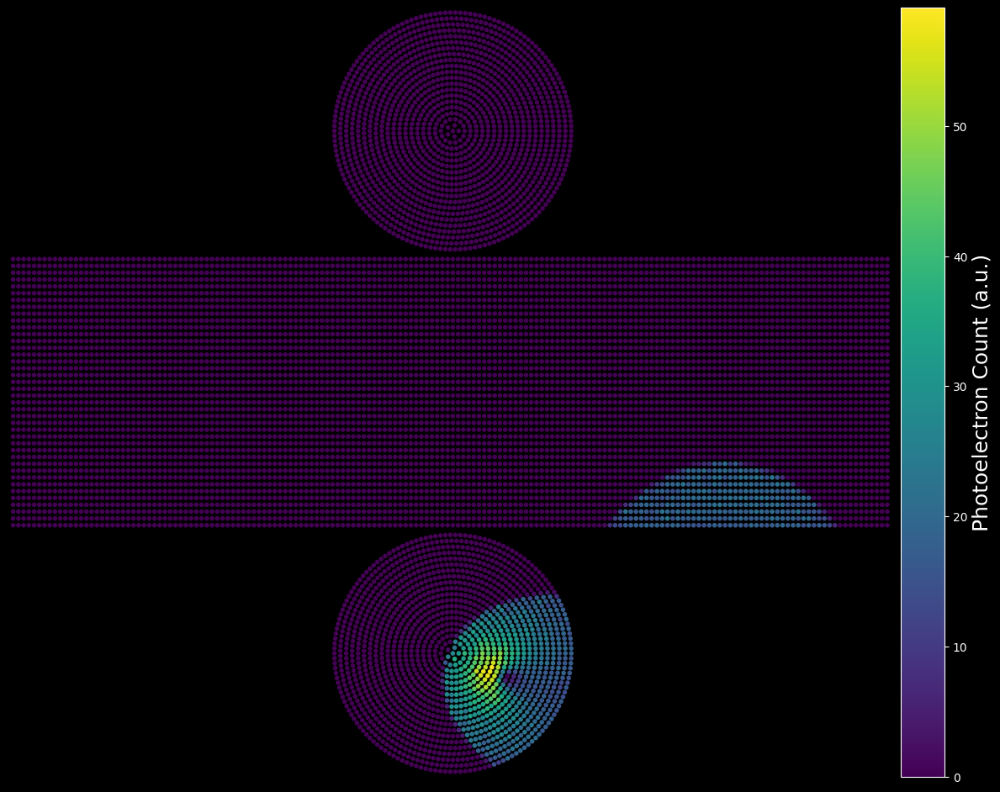

In [27]:
# plot initial guess

simulated_charges, simulated_times = simulate_event(guess, key)

detector_display(simulated_charges, simulated_times, file_name='initial_guess_display.png', plot_time=False)

Event Parameters:
────────────────────
Energy: 700.90 MeV
Initial Position: (-0.46, -0.20, 0.55)
Initial Direction: (0.48, 0.20, -0.86)
────────────────────
Event Parameters:
────────────────────
Energy: 662.15 MeV
Initial Position: (-0.02, 0.46, -0.44)
Initial Direction: (0.56, 0.11, -0.82)
────────────────────


2025-03-16 23:59:42.597378: W external/xla/xla/hlo/transforms/host_offloader.cc:372] Token parameters are not supported for streaming.


Step: 0, Loss: 0.46158748865127563
Step: 100, Loss: 0.331989049911499
Step: 200, Loss: 0.22951722145080566
Step: 300, Loss: 0.09670112282037735
Step: 400, Loss: 0.02988768182694912
Step: 500, Loss: 0.01897415891289711
Step: 600, Loss: 0.01574881374835968
Step: 700, Loss: 0.019426682963967323
Step: 800, Loss: 0.006486742757260799
Step: 900, Loss: 0.006508952938020229
Step: 1000, Loss: 0.0034297106321901083
Step: 1100, Loss: 0.010216310620307922
Step: 1200, Loss: 0.0049562519416213036
Step: 1300, Loss: 0.01019199937582016
Step: 1400, Loss: 0.003861013799905777
Step: 1500, Loss: 0.006311945617198944
Step: 1600, Loss: 0.01201696414500475
Step: 1700, Loss: 0.013384261168539524
Step: 1800, Loss: 0.007312622852623463
Step: 1900, Loss: 0.009989708662033081


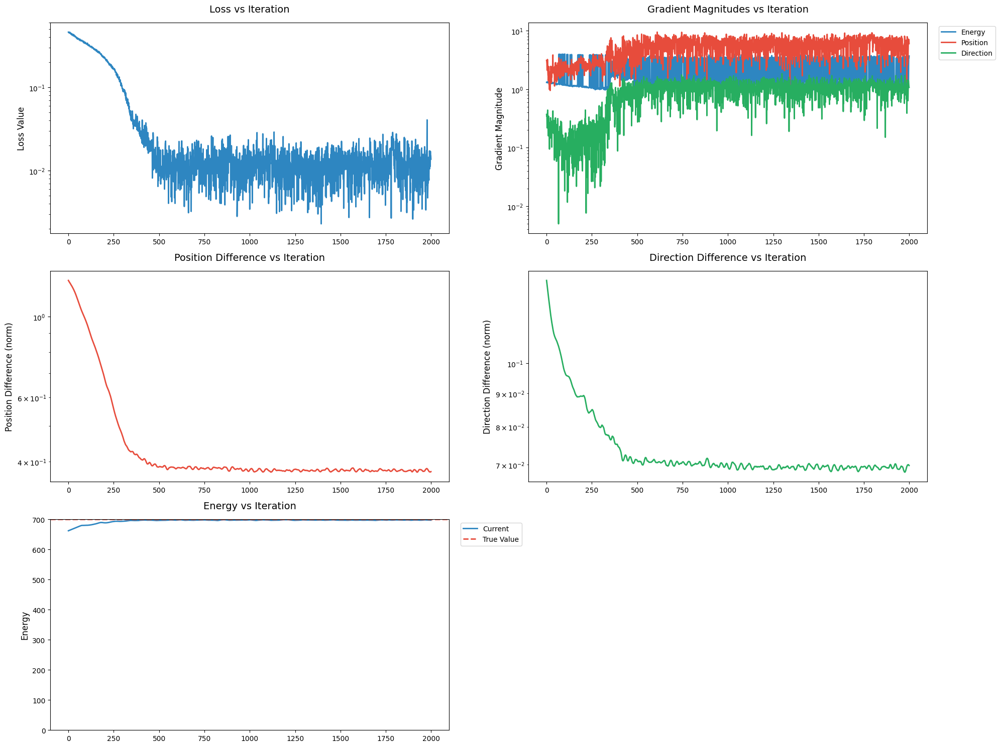

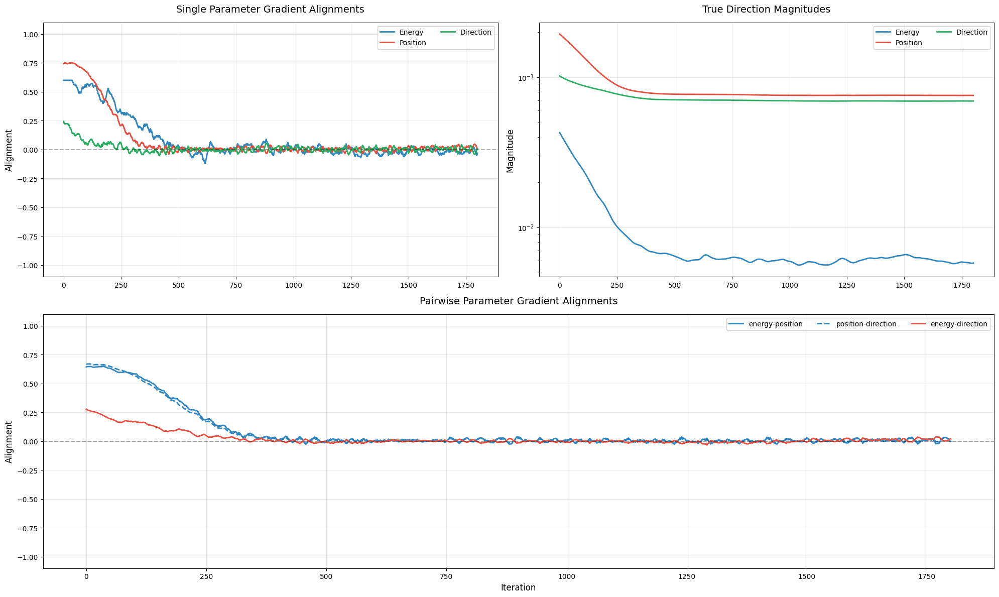

Simulated Event:


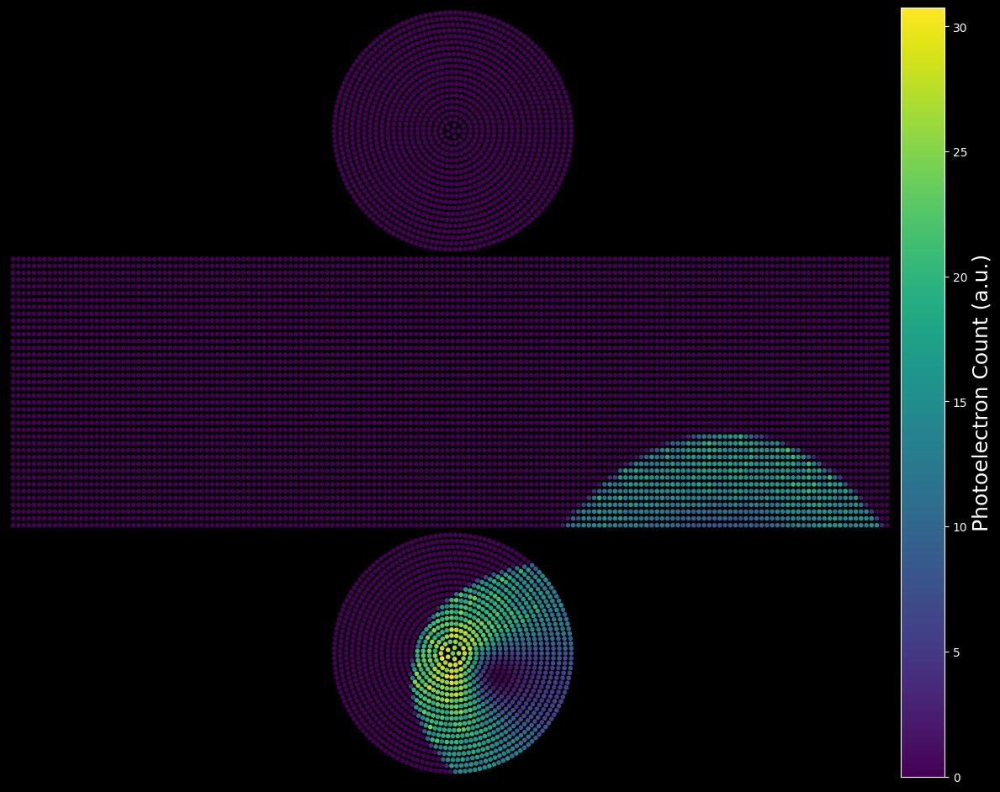

True Event:


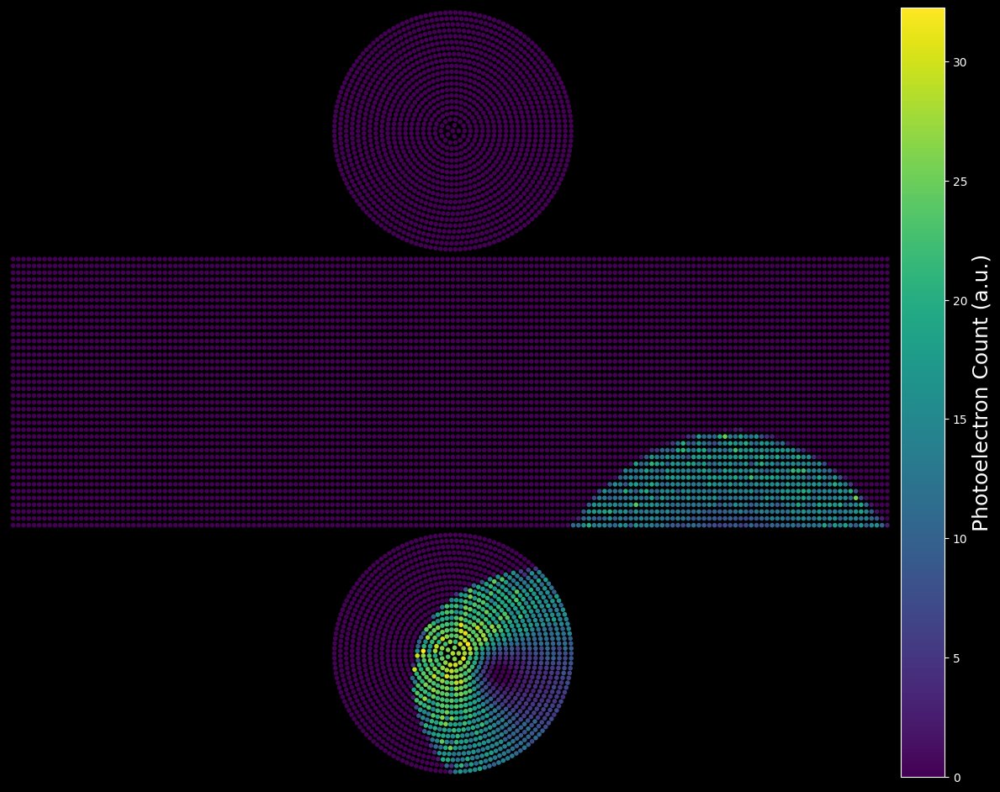

Final Parameters:
Event Parameters:
────────────────────
Energy: 697.61 MeV
Initial Position: (-0.56, 0.16, 0.59)
Initial Direction: (0.49, 0.13, -0.86)
────────────────────
True Parameters:
Event Parameters:
────────────────────
Energy: 700.90 MeV
Initial Position: (-0.46, -0.20, 0.55)
Initial Direction: (0.48, 0.20, -0.86)
────────────────────
Difference in Parameters:
Energy:  -3.2868652 MeV, Percent:  -0.46894875 %
Position:  0.3749383 , difference/pmt_radius:  9.373458
Direction:  0.069755346 , Angular:  3.9974303  degrees


In [18]:
import jax
import jax.numpy as jnp
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from typing import Tuple, Dict, Any, NamedTuple

# Simplified scales structure without gradient_modifiers
class OptimizationScales(NamedTuple):
    """Stores scaling factors for optimization"""
    parameter_scales: Dict[str, float]
    gradient_scales: Dict[str, float]

def create_default_scales() -> OptimizationScales:
    """Creates default optimization scales without modifiers"""
    parameter_scales = {
        'energy': 500.0,
        'position': 5.0,
        'direction': 1.0
    }

    gradient_scales = {
        'energy': 2.408e+02 * 0.01,
        'position': 1.282e+00,
        'direction': 2.722e-01,
    }

    return OptimizationScales(
        parameter_scales=parameter_scales,
        gradient_scales=gradient_scales
    )

class AdamState(NamedTuple):
    """Stores Adam optimizer state"""
    params: Tuple
    m: Tuple  # First moment (momentum)
    v: Tuple  # Second moment (velocity)
    step: int

def init_adam_state(initial_params: Tuple) -> AdamState:
    """Initialize Adam optimizer state with zero first and second moments

    Args:
        initial_params: Tuple of (energy, position, direction)
            energy: float, energy in arbitrary units
            position: jnp.ndarray of shape (3,), position vector
            direction: jnp.ndarray of shape (3,), direction vector (normalized)

    Returns:
        AdamState with zero moments initialized for each parameter
    """
    # Convert any numpy arrays to JAX arrays
    initial_params = tuple(
        jnp.asarray(p) if isinstance(p, (np.ndarray, float, int)) else p
        for p in initial_params
    )

    # Initialize moments as zeros with same shape as parameters
    zeros = tuple(jnp.zeros_like(p) for p in initial_params)

    # Create and return optimizer state
    return AdamState(
        params=initial_params,
        m=zeros,
        v=zeros,
        step=0
    )

@jax.jit
def compute_parameter_alignments(
    current_params: Tuple,
    true_params: Tuple,
    scaled_grads: Tuple,
    scales: OptimizationScales,
    eps: float = 1e-8
) -> Tuple[Dict[str, float], Dict[str, float], Dict[str, float]]:
    """Compute alignment between gradient descent direction and true direction

    Note: Gradient descent moves in -gradient direction, so we compare
    true_direction with -gradient
    """
    # Compute true directions (scaled appropriately)
    true_dirs = {
        'energy': (true_params[0] - current_params[0]) / scales.parameter_scales['energy'],
        'position': (true_params[1] - current_params[1]) / scales.parameter_scales['position'],
        'direction': true_params[2] - current_params[2]  # Already normalized
    }

    # Store true direction magnitudes
    magnitudes = {
        'energy': jnp.abs(true_dirs['energy']),
        'position': jnp.linalg.norm(true_dirs['position']),
        'direction': jnp.linalg.norm(true_dirs['direction'])
    }

    # Single parameter alignments
    single_alignments = {}

    # Scalar parameter (energy)
    true_dir = true_dirs['energy']
    grad = scaled_grads[0]
    # Compare with -gradient for correct alignment
    single_alignments['energy'] = jnp.sign(true_dir) * jnp.sign(-grad)

    # Vector parameters (position, direction)
    for name, idx in [('position', 1), ('direction', 2)]:
        true_dir = true_dirs[name]
        grad = scaled_grads[idx]
        true_norm = jnp.linalg.norm(true_dir) + eps
        grad_norm = jnp.linalg.norm(grad) + eps
        true_normalized = true_dir / true_norm
        grad_normalized = -grad / grad_norm  # Negative gradient for descent direction
        single_alignments[name] = jnp.sum(true_normalized * grad_normalized)

    # Pairwise alignments
    pair_alignments = {}
    param_names = ['energy', 'position', 'direction']

    for i, name1 in enumerate(param_names):
        for name2 in param_names[i+1:]:
            # Get true directions and gradients
            true_dir1 = jnp.ravel(true_dirs[name1])
            true_dir2 = jnp.ravel(true_dirs[name2])
            grad1 = jnp.ravel(scaled_grads[param_names.index(name1)])
            grad2 = jnp.ravel(scaled_grads[param_names.index(name2)])

            # Combine vectors
            true_combined = jnp.concatenate([true_dir1, true_dir2])
            grad_combined = -jnp.concatenate([grad1, grad2])  # Negative for descent direction

            # Normalize for pure directional measure
            true_norm = jnp.linalg.norm(true_combined) + eps
            grad_norm = jnp.linalg.norm(grad_combined) + eps
            alignment = jnp.sum((true_combined/true_norm) * (grad_combined/grad_norm))

            pair_alignments[f"{name1}_{name2}"] = alignment

    return single_alignments, pair_alignments, magnitudes

@jax.jit
def single_adam_step(
    opt_state: AdamState,
    true_charges: jnp.ndarray,
    true_times: jnp.ndarray,
    detector_points: jnp.ndarray,
    key: jnp.ndarray,
    scales: OptimizationScales,
    learning_rate: float = 0.001,
    beta1: float = 0.9,
    beta2: float = 0.999,
    epsilon: float = 1e-8,
    gradient_clip: float = 1.0,
) -> Tuple[AdamState, float, Dict[str, float], Tuple]:
    """
    Perform a single optimization step with Adam

    Args:
        opt_state: Current optimizer state
        true_charges: Target charge values
        true_times: Target time values
        detector_points: Detector positions
        key: JAX random key
        scales: OptimizationScales object containing all scale factors
        learning_rate: Current learning rate (typically 0.001 for Adam)
        beta1: First moment decay rate (typically 0.9)
        beta2: Second moment decay rate (typically 0.999)
        epsilon: Small constant for numerical stability (typically 1e-8)
        gradient_clip: Max gradient norm

    Returns:
        new_state: Updated optimizer state
        loss: Current loss value
        grad_norms: Dictionary of gradient norms for each parameter
        clipped_grads: Scaled and clipped gradients
    """
    def normalize_params(params):
        energy, pos, direc = params
        return (
            energy / scales.parameter_scales['energy'],
            pos / scales.parameter_scales['position'],
            direc  # already normalized
        )

    def unnormalize_params(norm_params):
        energy, pos, direc = norm_params
        return (
            energy * scales.parameter_scales['energy'],
            pos * scales.parameter_scales['position'],
            direc  # keep normalized
        )

    def loss_fn(norm_params):
        params = unnormalize_params(norm_params)
        simulated_charges, simulated_times = simulate_event(params, key)
        return compute_simplified_loss(
            detector_points,
            true_charges,
            true_times,
            simulated_charges,
            simulated_times
        )

    # Normalize current parameters
    norm_params = normalize_params(opt_state.params)

    # Get loss and gradients
    value_and_grad_fn = jax.value_and_grad(loss_fn)
    loss, grads = value_and_grad_fn(norm_params)

    # Scale gradients (no modifiers)
    scaled_grads = (
        grads[0] * scales.gradient_scales['energy'],
        grads[1] * scales.gradient_scales['position'],
        grads[2] * scales.gradient_scales['direction']
    )

    # Clip gradients
    grad_norm = jnp.sqrt(sum(jnp.sum(g**2) for g in scaled_grads))
    scale = jnp.minimum(1.0, gradient_clip / (grad_norm + 1e-6))
    clipped_grads = tuple(g * scale for g in scaled_grads)

    # Increment step
    step = opt_state.step + 1

    # Update biased first moment estimate
    m = tuple(
        beta1 * m_i + (1 - beta1) * g_i
        for m_i, g_i in zip(opt_state.m, clipped_grads)
    )

    # Update biased second raw moment estimate
    v = tuple(
        beta2 * v_i + (1 - beta2) * g_i**2
        for v_i, g_i in zip(opt_state.v, clipped_grads)
    )

    # Compute bias-corrected first moment estimate
    m_hat = tuple(
        m_i / (1 - beta1**step)
        for m_i in m
    )

    # Compute bias-corrected second raw moment estimate
    v_hat = tuple(
        v_i / (1 - beta2**step)
        for v_i in v
    )

    # Update normalized parameters
    new_norm_params = tuple(
        p - learning_rate * m_hat_i / (jnp.sqrt(v_hat_i) + epsilon)
        for p, m_hat_i, v_hat_i in zip(norm_params, m_hat, v_hat)
    )

    # Unnormalize parameters
    new_params = unnormalize_params(new_norm_params)

    # Normalize direction vector
    energy, pos, direction = new_params
    direction = direction / jnp.linalg.norm(direction)
    new_params = (energy, pos, direction)

    # Calculate gradient norms
    grad_norms = {
        'energy': jnp.linalg.norm(scaled_grads[0]),
        'position': jnp.linalg.norm(scaled_grads[1]),
        'direction': jnp.linalg.norm(scaled_grads[2])
    }

    # Update optimizer state
    new_state = AdamState(
        params=new_params,
        m=m,
        v=v,
        step=step
    )

    return new_state, loss, grad_norms, clipped_grads

def optimize_with_adam(
    true_charges: jnp.ndarray,
    true_times: jnp.ndarray,
    guess_params: Tuple,
    true_params: Tuple,
    detector_points: jnp.ndarray,
    key: jnp.ndarray,
    scales: OptimizationScales = None,
    num_steps: int = 1000,
    learning_rate: float = 0.001,
    beta1: float = 0.9,
    beta2: float = 0.999,
    epsilon: float = 1e-8,
    gradient_clip: float = 1.0,
    print_every: int = 100
) -> Tuple[Tuple, Dict[str, Any]]:
    """Run full optimization loop with Adam optimizer

    Args:
        true_charges: Target charge values
        true_times: Target time values
        guess_params: Initial parameter guess
        true_params: True parameters (for alignment calculation)
        detector_points: Detector positions
        key: JAX random key
        scales: OptimizationScales object containing scale factors
        num_steps: Number of optimization steps
        learning_rate: Learning rate (typically 0.001 for Adam)
        beta1: First moment decay rate (typically 0.9)
        beta2: Second moment decay rate (typically 0.999)
        epsilon: Small constant for numerical stability (typically 1e-8)
        gradient_clip: Max gradient norm
        print_every: Frequency of printing progress

    Returns:
        final_params: Optimized parameters
        history: Optimization history for visualization
    """
    if scales is None:
        scales = create_default_scales()

    history = {
        'loss': jnp.zeros(num_steps),
        'params': {
            'energy': jnp.zeros(num_steps),
            'position': jnp.zeros((num_steps, 3)),
            'direction': jnp.zeros((num_steps, 3))
        },
        'grad_norms': {
            'energy': jnp.zeros(num_steps),
            'position': jnp.zeros(num_steps),
            'direction': jnp.zeros(num_steps)
        },
        'alignments': {
            'single': {
                'energy': jnp.zeros(num_steps),
                'position': jnp.zeros(num_steps),
                'direction': jnp.zeros(num_steps)
            },
            'paired': {
                'energy_position': jnp.zeros(num_steps),
                'energy_direction': jnp.zeros(num_steps),
                'position_direction': jnp.zeros(num_steps)
            },
            'magnitudes': {
                'energy': jnp.zeros(num_steps),
                'position': jnp.zeros(num_steps),
                'direction': jnp.zeros(num_steps)
            }
        }
    }

    opt_state = init_adam_state(guess_params)
    key_seq = jax.random.split(key, num_steps)

    def step_fn(carry, step_and_key):
        opt_state, history = carry
        step, key = step_and_key

        new_opt_state, loss, grad_norms, clipped_grads = single_adam_step(
            opt_state, true_charges, true_times,
            detector_points, key, scales, learning_rate,
            beta1, beta2, epsilon, gradient_clip
        )

        # Compute alignments
        single_alignments, pair_alignments, magnitudes = compute_parameter_alignments(
            new_opt_state.params, true_params,
            clipped_grads,
            scales
        )

        def print_fn(_):
            jax.debug.print("Step: {}, Loss: {}",
                          step, loss, ordered=True)
            return None

        def no_print(_):
            return None

        jax.lax.cond(
            step % print_every == 0,
            print_fn,
            no_print,
            operand=None
        )

        new_history = {
            'loss': history['loss'].at[step].set(loss),
            'params': {
                'energy': history['params']['energy'].at[step].set(new_opt_state.params[0]),
                'position': history['params']['position'].at[step].set(new_opt_state.params[1]),
                'direction': history['params']['direction'].at[step].set(new_opt_state.params[2])
            },
            'grad_norms': {
                'energy': history['grad_norms']['energy'].at[step].set(grad_norms['energy']),
                'position': history['grad_norms']['position'].at[step].set(grad_norms['position']),
                'direction': history['grad_norms']['direction'].at[step].set(grad_norms['direction'])
            },
            'alignments': {
                'single': {
                    param: history['alignments']['single'][param].at[step].set(single_alignments[param])
                    for param in single_alignments
                },
                'paired': {
                    pair: history['alignments']['paired'][pair].at[step].set(pair_alignments[pair])
                    for pair in pair_alignments
                },
                'magnitudes': {
                    param: history['alignments']['magnitudes'][param].at[step].set(magnitudes[param])
                    for param in magnitudes
                }
            }
        }

        return (new_opt_state, new_history), None

    steps = jnp.arange(num_steps)
    (final_state, final_history), _ = jax.lax.scan(
        step_fn,
        (opt_state, history),
        (steps, key_seq)
    )

    return final_state.params, final_history

def smooth_data(data: np.ndarray, window: int = 10) -> np.ndarray:
    """Smooth data by taking rolling average

    Args:
        data: Input data array
        window: Size of smoothing window

    Returns:
        Smoothed data array
    """
    # Handle arrays of different shapes
    if len(data.shape) == 1:
        kernel = np.ones(window) / window
        return np.convolve(data, kernel, mode='valid')
    else:
        # For 2D arrays (e.g., position vectors)
        smoothed = np.zeros((len(data) - window + 1, data.shape[1]))
        for i in range(data.shape[1]):
            kernel = np.ones(window) / window
            smoothed[:, i] = np.convolve(data[:, i], kernel, mode='valid')
        return smoothed

def plot_alignment_history(history: Dict[str, Any], window: int = 10, figsize: Tuple[int, int] = (20, 12)):
    """Plot alignment history with improved layout and smoothing"""
    param_names = ['energy', 'position', 'direction']

    fig = plt.figure(figsize=figsize)
    gs = gridspec.GridSpec(2, 2, height_ratios=[1, 1])

    # 1. Single parameter alignments
    ax1 = fig.add_subplot(gs[0, 0])
    colors = ['#2E86C1', '#E74C3C', '#27AE60']
    for param, color in zip(param_names, colors):
        data = np.array(history['alignments']['single'][param])
        smoothed_data = smooth_data(data, window)
        x = np.arange(len(smoothed_data))
        ax1.plot(x, smoothed_data, label=param.capitalize(), color=color, linewidth=2)

    ax1.set_ylabel('Alignment', fontsize=12)
    ax1.set_title('Single Parameter Gradient Alignments', fontsize=14, pad=15)
    ax1.grid(True, alpha=0.3)
    ax1.axhline(y=0, color='k', linestyle='--', alpha=0.3)
    ax1.set_ylim(-1.1, 1.1)
    ax1.legend(fontsize=10, ncol=2)

    # 2. Magnitudes
    ax2 = fig.add_subplot(gs[0, 1])
    for param, color in zip(param_names, colors):
        data = np.array(history['alignments']['magnitudes'][param])
        smoothed_data = smooth_data(data, window)
        x = np.arange(len(smoothed_data))
        ax2.plot(x, smoothed_data, label=param.capitalize(), color=color, linewidth=2)

    ax2.set_ylabel('Magnitude', fontsize=12)
    ax2.set_title('True Direction Magnitudes', fontsize=14, pad=15)
    ax2.set_yscale('log')
    ax2.grid(True, alpha=0.3)
    ax2.legend(fontsize=10, ncol=2)

    # 3. Pairwise alignments - split into two groups for clarity
    ax3 = fig.add_subplot(gs[1, :])
    # Group 1: Position-related pairs
    position_pairs = ['energy_position', 'position_direction']
    # Group 2: Remaining pairs
    other_pairs = ['energy_direction']

    linestyles = ['-', '--', ':']
    for i, pair in enumerate(position_pairs):
        data = np.array(history['alignments']['paired'][pair])
        smoothed_data = smooth_data(data, window)
        x = np.arange(len(smoothed_data))
        ax3.plot(x, smoothed_data, label=pair.replace('_', '-'),
                linestyle=linestyles[i], color='#2E86C1', linewidth=2)

    for i, pair in enumerate(other_pairs):
        data = np.array(history['alignments']['paired'][pair])
        smoothed_data = smooth_data(data, window)
        x = np.arange(len(smoothed_data))
        ax3.plot(x, smoothed_data, label=pair.replace('_', '-'),
                linestyle=linestyles[i], color='#E74C3C', linewidth=2)

    ax3.set_ylabel('Alignment', fontsize=12)
    ax3.set_xlabel('Iteration', fontsize=12)
    ax3.set_title('Pairwise Parameter Gradient Alignments', fontsize=14, pad=15)
    ax3.grid(True, alpha=0.3)
    ax3.axhline(y=0, color='k', linestyle='--', alpha=0.3)
    ax3.set_ylim(-1.1, 1.1)
    ax3.legend(fontsize=10, ncol=3)

    plt.tight_layout()
    plt.show()

def plot_optimization_history(history: Dict[str, Any], true_params: Tuple):
    """
    Plot optimization history with enhanced visualization

    Args:
        history: Optimization history dictionary
        true_params: True parameter values for comparison
    """
    fig = plt.figure(figsize=(20, 15))
    gs = gridspec.GridSpec(3, 2)

    # 1. Loss plot
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.plot(history['loss'], color='#2E86C1', linewidth=2)
    ax1.set_ylabel('Loss Value', fontsize=12)
    ax1.set_yscale('log')
    ax1.set_title('Loss vs Iteration', fontsize=14, pad=15)
    ax1.tick_params(labelsize=10)

    # 2. Gradient norms
    ax2 = fig.add_subplot(gs[0, 1])
    colors = ['#2E86C1', '#E74C3C', '#27AE60']
    for param, color in zip(['energy', 'position', 'direction'], colors):
        ax2.plot(history['grad_norms'][param], label=param.capitalize(),
                color=color, linewidth=2)
    ax2.set_ylabel('Gradient Magnitude', fontsize=12)
    ax2.set_yscale('log')
    ax2.legend(fontsize=10, bbox_to_anchor=(1.02, 1), loc='upper left')
    ax2.set_title('Gradient Magnitudes vs Iteration', fontsize=14, pad=15)
    ax2.tick_params(labelsize=10)

    # 3. Position Difference
    ax3 = fig.add_subplot(gs[1, 0])
    ax3.plot(np.linalg.norm(history['params']['position'] - true_params[1], axis=1),
            color='#E74C3C', linewidth=2)
    ax3.set_ylabel('Position Difference (norm)', fontsize=12)
    ax3.set_yscale('log')
    ax3.set_title('Position Difference vs Iteration', fontsize=14, pad=15)
    ax3.tick_params(labelsize=10)

    # 4. Direction Difference
    ax4 = fig.add_subplot(gs[1, 1])
    ax4.plot(np.linalg.norm(history['params']['direction'] - true_params[2], axis=1),
            color='#27AE60', linewidth=2)
    ax4.set_ylabel('Direction Difference (norm)', fontsize=12)
    ax4.set_yscale('log')
    ax4.set_title('Direction Difference vs Iteration', fontsize=14, pad=15)
    ax4.tick_params(labelsize=10)

    # 5. Energy Values
    ax5 = fig.add_subplot(gs[2, 0])
    ax5.plot(history['params']['energy'], label='Current', color='#2E86C1', linewidth=2)
    ax5.axhline(y=true_params[0], color='#E74C3C', linestyle='--',
                label='True Value', linewidth=2)
    ax5.set_ylabel('Energy', fontsize=12)
    ax5.legend(fontsize=10, bbox_to_anchor=(1.02, 1), loc='upper left')
    ax5.set_title('Energy vs Iteration', fontsize=14, pad=15)
    ax5.set_ylim(bottom=0)
    ax5.tick_params(labelsize=10)

    # Adjust layout
    plt.tight_layout()
    plt.show()

# Example usage
if __name__ == "__main__":
    key = jax.random.PRNGKey(175)

    # Load pre-simulated event data
    event_location = 'events/test_event_data.h5'
    loaded_params, loaded_charges, loaded_times = load_single_event(
        event_location, NUM_DETECTORS, sparse=False
    )
    print_params(loaded_params)

    # Get initial guess
    guess = get_initial_guess(loaded_charges, detector_points, key=key)
    print_params(guess)

    # Create scales
    scales = create_default_scales()

    # Run Adam optimization
    final_params, history = optimize_with_adam(
        true_charges=loaded_charges,
        true_times=loaded_times,
        guess_params=guess,
        true_params=loaded_params,
        detector_points=detector_points,
        key=key,
        scales=scales,
        num_steps=2000,
        learning_rate=0.0005,  # Standard Adam learning rate
        beta1=0.95,            # Standard Adam beta1
        beta2=0.99,          # Standard Adam beta2
        epsilon=1e-8,         # Standard Adam epsilon
        gradient_clip=1.0,    # Prevent gradient explosions
        print_every=100
    )

    # Plot optimization history
    plot_optimization_history(history, loaded_params)

    plot_alignment_history(history, window=200)

    # Visualize final result
    detector_display = create_detector_display(sparse=False)
    final_charges, final_times = simulate_event(final_params, key)
    print("Simulated Event:")
    detector_display(final_charges, final_times, file_name='final_event_display.png', plot_time=False)

    print("True Event:")
    detector_display(loaded_charges, loaded_times, file_name='true_event_display.png', plot_time=False)

    # Print differences
    print("Final Parameters:")
    print_params(final_params)

    print("True Parameters:")
    print_params(loaded_params)

    print("Difference in Parameters:")
    print("Energy: ", final_params[0] - loaded_params[0], "MeV, Percent: ", (final_params[0] - loaded_params[0]) / loaded_params[0] * 100, "%")
    print("Position: ", jnp.linalg.norm(final_params[1] - loaded_params[1]), ", difference/pmt_radius: ", jnp.linalg.norm(final_params[1] - loaded_params[1]) / detector_radius)
    print("Direction: ", jnp.linalg.norm(final_params[2] - loaded_params[2]), ", Angular: ", jnp.arccos(jnp.dot(final_params[2], loaded_params[2])) * 180 / np.pi, " degrees")

In [22]:
temperature_sim = 1.0
simulate_event = event_simulators[temperature_sim]

Event Parameters:
────────────────────
Energy: 700.90 MeV
Initial Position: (-0.46, -0.20, 0.55)
Initial Direction: (0.48, 0.20, -0.86)
────────────────────
Event Parameters:
────────────────────
Energy: 872.18 MeV
Initial Position: (0.46, 0.10, 0.13)
Initial Direction: (-0.71, -0.05, -0.70)
────────────────────
Step: 0, Loss: 4.648215293884277, LR: 0.05
Step: 100, Loss: 0.11833272874355316, LR: 0.05
Reducing learning rate to 0.034999999999999996 at step 171
Step: 200, Loss: 0.0740945115685463, LR: 0.034999999999999996
Reducing learning rate to 0.024499999999999997 at step 275
Step: 300, Loss: 0.043662410229444504, LR: 0.024499999999999997
Reducing learning rate to 0.01715 at step 325
Step: 400, Loss: 0.020317992195487022, LR: 0.01715
Reducing learning rate to 0.012004999999999998 at step 454


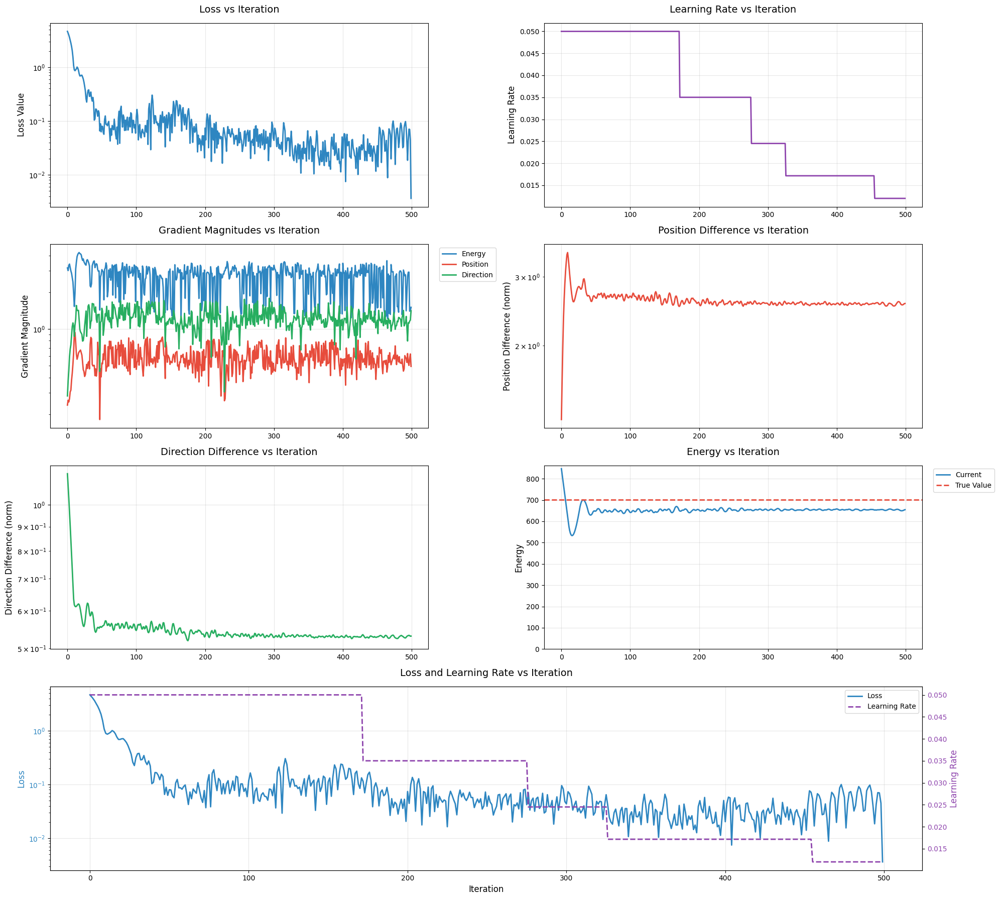

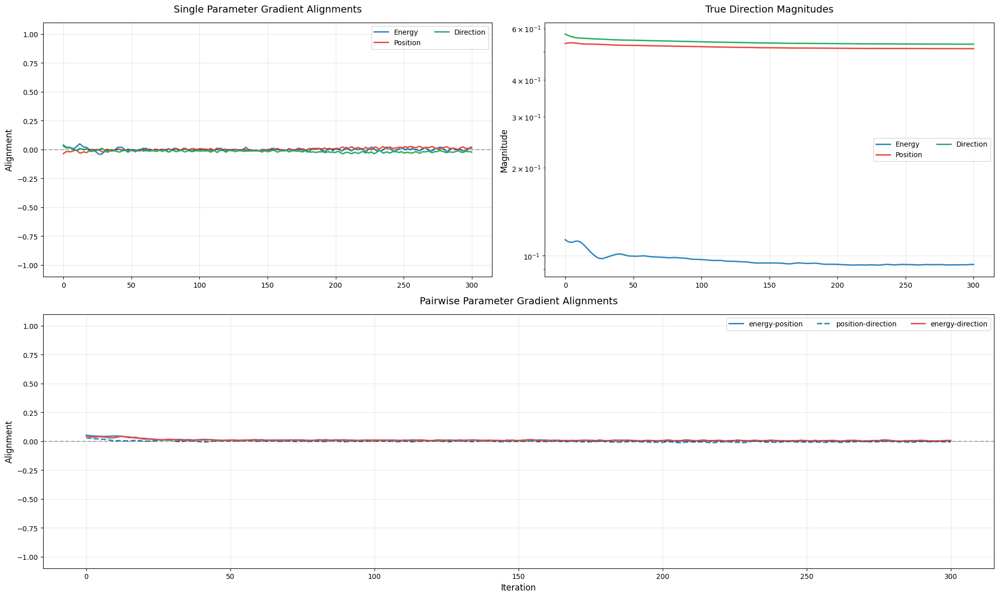

Simulated Event:


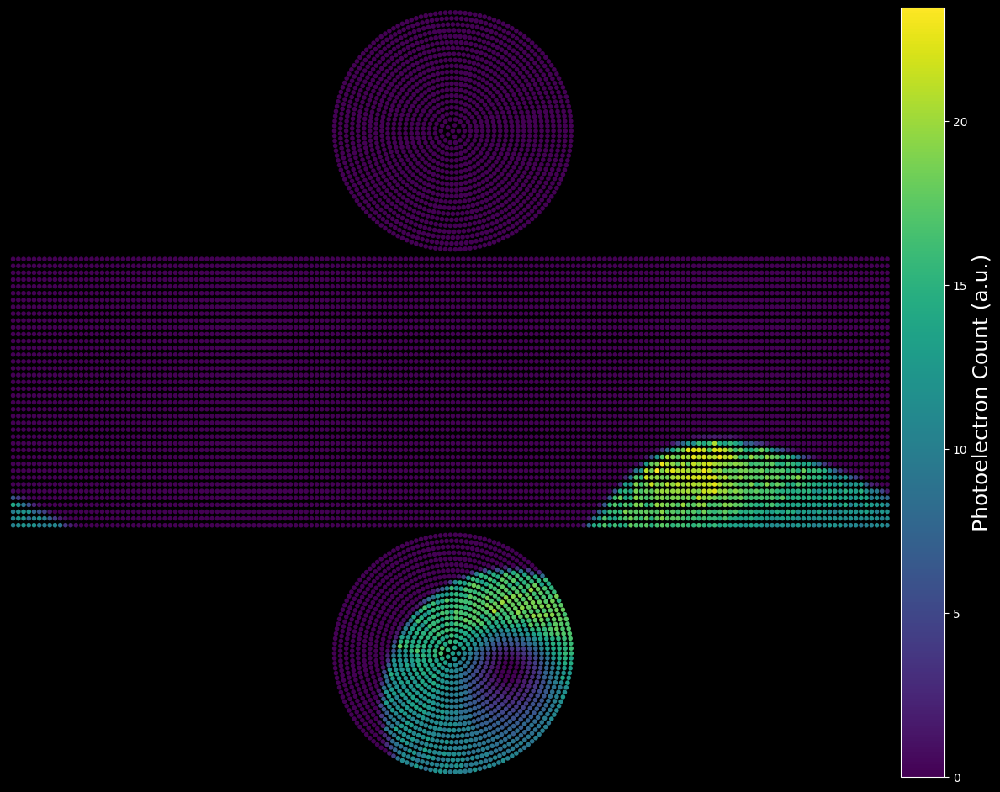

True Event:


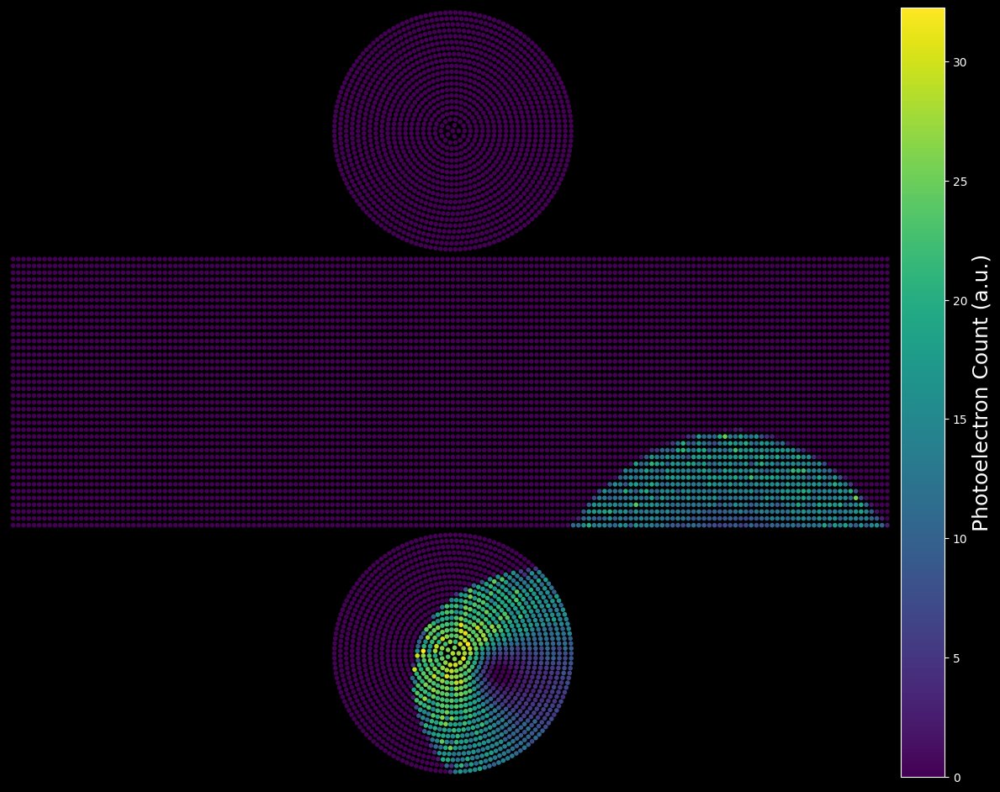

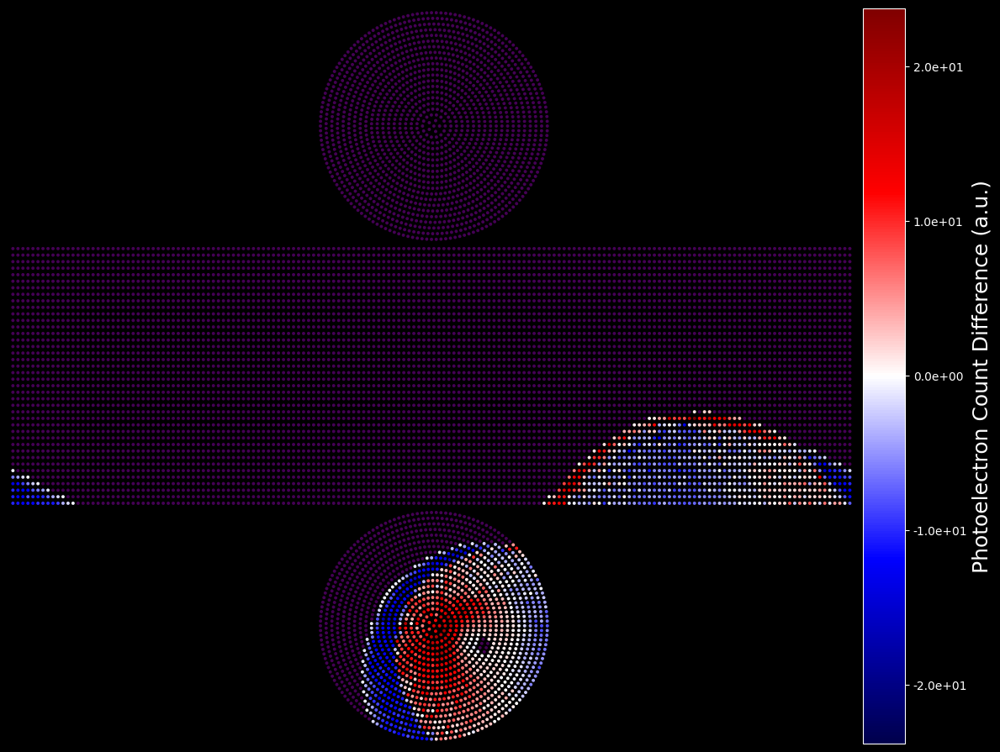

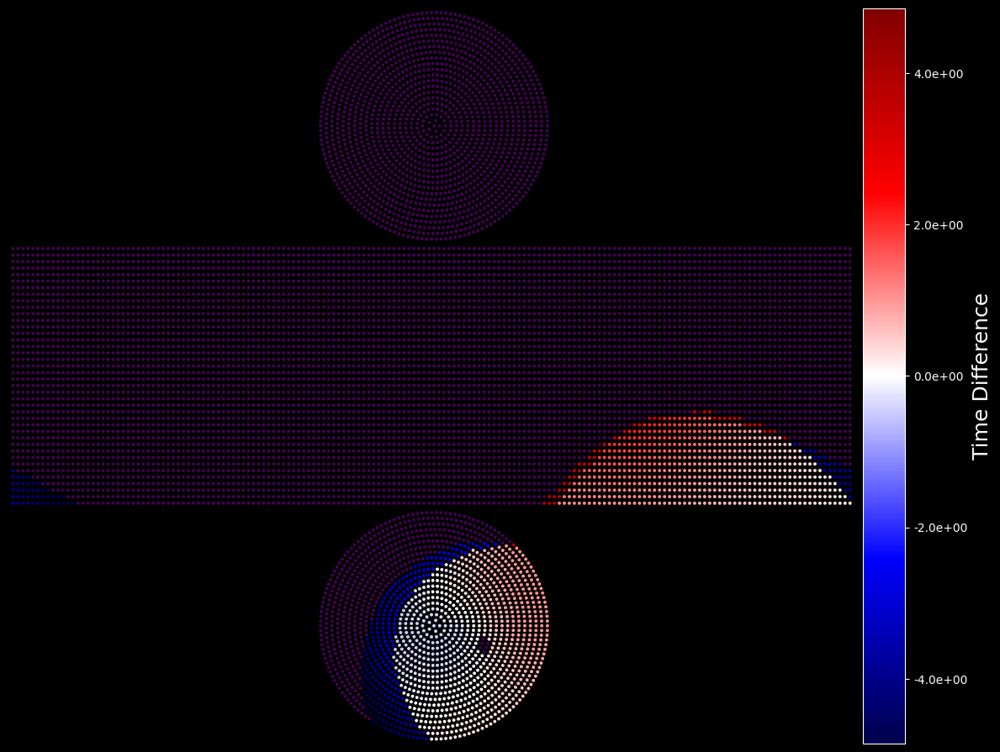

Final Parameters:
Event Parameters:
────────────────────
Energy: 654.57 MeV
Initial Position: (2.00, -0.50, 1.22)
Initial Direction: (-0.04, 0.24, -0.97)
────────────────────
True Parameters:
Event Parameters:
────────────────────
Energy: 700.90 MeV
Initial Position: (-0.46, -0.20, 0.55)
Initial Direction: (0.48, 0.20, -0.86)
────────────────────
Difference in Parameters:
Energy:  -46.332886 MeV, Percent:  -6.610478 %
Position:  2.5625076 , difference/pmt_radius:  64.06269
Direction:  0.53105867 , Angular:  30.796812  degrees


In [38]:
import jax
import jax.numpy as jnp
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from typing import Tuple, Dict, Any, NamedTuple

# Simplified scales structure without gradient_modifiers
class OptimizationScales(NamedTuple):
    """Stores scaling factors for optimization"""
    parameter_scales: Dict[str, float]
    gradient_scales: Dict[str, float]

def create_default_scales() -> OptimizationScales:
    """Creates default optimization scales without modifiers"""
    parameter_scales = {
        'energy': 500.0,
        'position': 5.0,
        'direction': 1.0
    }

    gradient_scales = {
        'energy': 2.408e+02 * 0.01,
        'position': 1.282e+00 * 0.1,
        'direction': 2.722e-01,
    }

    return OptimizationScales(
        parameter_scales=parameter_scales,
        gradient_scales=gradient_scales
    )

class AdamState(NamedTuple):
    """Stores Adam optimizer state"""
    params: Tuple
    m: Tuple  # First moment (momentum)
    v: Tuple  # Second moment (velocity)
    step: int

def init_adam_state(initial_params: Tuple) -> AdamState:
    """Initialize Adam optimizer state with zero first and second moments

    Args:
        initial_params: Tuple of (energy, position, direction)
            energy: float, energy in arbitrary units
            position: jnp.ndarray of shape (3,), position vector
            direction: jnp.ndarray of shape (3,), direction vector (normalized)

    Returns:
        AdamState with zero moments initialized for each parameter
    """
    # Convert any numpy arrays to JAX arrays
    initial_params = tuple(
        jnp.asarray(p) if isinstance(p, (np.ndarray, float, int)) else p
        for p in initial_params
    )

    # Initialize moments as zeros with same shape as parameters
    zeros = tuple(jnp.zeros_like(p) for p in initial_params)

    # Create and return optimizer state
    return AdamState(
        params=initial_params,
        m=zeros,
        v=zeros,
        step=0
    )

@jax.jit
def compute_parameter_alignments(
    current_params: Tuple,
    true_params: Tuple,
    scaled_grads: Tuple,
    scales: OptimizationScales,
    eps: float = 1e-8
) -> Tuple[Dict[str, float], Dict[str, float], Dict[str, float]]:
    """Compute alignment between gradient descent direction and true direction

    Note: Gradient descent moves in -gradient direction, so we compare
    true_direction with -gradient
    """
    # Compute true directions (scaled appropriately)
    true_dirs = {
        'energy': (true_params[0] - current_params[0]) / scales.parameter_scales['energy'],
        'position': (true_params[1] - current_params[1]) / scales.parameter_scales['position'],
        'direction': true_params[2] - current_params[2]  # Already normalized
    }

    # Store true direction magnitudes
    magnitudes = {
        'energy': jnp.abs(true_dirs['energy']),
        'position': jnp.linalg.norm(true_dirs['position']),
        'direction': jnp.linalg.norm(true_dirs['direction'])
    }

    # Single parameter alignments
    single_alignments = {}

    # Scalar parameter (energy)
    true_dir = true_dirs['energy']
    grad = scaled_grads[0]
    # Compare with -gradient for correct alignment
    single_alignments['energy'] = jnp.sign(true_dir) * jnp.sign(-grad)

    # Vector parameters (position, direction)
    for name, idx in [('position', 1), ('direction', 2)]:
        true_dir = true_dirs[name]
        grad = scaled_grads[idx]
        true_norm = jnp.linalg.norm(true_dir) + eps
        grad_norm = jnp.linalg.norm(grad) + eps
        true_normalized = true_dir / true_norm
        grad_normalized = -grad / grad_norm  # Negative gradient for descent direction
        single_alignments[name] = jnp.sum(true_normalized * grad_normalized)

    # Pairwise alignments
    pair_alignments = {}
    param_names = ['energy', 'position', 'direction']

    for i, name1 in enumerate(param_names):
        for name2 in param_names[i+1:]:
            # Get true directions and gradients
            true_dir1 = jnp.ravel(true_dirs[name1])
            true_dir2 = jnp.ravel(true_dirs[name2])
            grad1 = jnp.ravel(scaled_grads[param_names.index(name1)])
            grad2 = jnp.ravel(scaled_grads[param_names.index(name2)])

            # Combine vectors
            true_combined = jnp.concatenate([true_dir1, true_dir2])
            grad_combined = -jnp.concatenate([grad1, grad2])  # Negative for descent direction

            # Normalize for pure directional measure
            true_norm = jnp.linalg.norm(true_combined) + eps
            grad_norm = jnp.linalg.norm(grad_combined) + eps
            alignment = jnp.sum((true_combined/true_norm) * (grad_combined/grad_norm))

            pair_alignments[f"{name1}_{name2}"] = alignment

    return single_alignments, pair_alignments, magnitudes

@jax.jit
def single_adam_step(
    opt_state: AdamState,
    true_charges: jnp.ndarray,
    true_times: jnp.ndarray,
    detector_points: jnp.ndarray,
    key: jnp.ndarray,
    scales: OptimizationScales,
    learning_rate: float = 0.001,
    beta1: float = 0.9,
    beta2: float = 0.999,
    epsilon: float = 1e-8,
    gradient_clip: float = 1.0,
) -> Tuple[AdamState, float, Dict[str, float], Tuple]:
    """
    Perform a single optimization step with Adam

    Args:
        opt_state: Current optimizer state
        true_charges: Target charge values
        true_times: Target time values
        detector_points: Detector positions
        key: JAX random key
        scales: OptimizationScales object containing all scale factors
        learning_rate: Current learning rate (typically 0.001 for Adam)
        beta1: First moment decay rate (typically 0.9)
        beta2: Second moment decay rate (typically 0.999)
        epsilon: Small constant for numerical stability (typically 1e-8)
        gradient_clip: Max gradient norm

    Returns:
        new_state: Updated optimizer state
        loss: Current loss value
        grad_norms: Dictionary of gradient norms for each parameter
        clipped_grads: Scaled and clipped gradients
    """
    def normalize_params(params):
        energy, pos, direc = params
        return (
            energy / scales.parameter_scales['energy'],
            pos / scales.parameter_scales['position'],
            direc  # already normalized
        )

    def unnormalize_params(norm_params):
        energy, pos, direc = norm_params
        return (
            energy * scales.parameter_scales['energy'],
            pos * scales.parameter_scales['position'],
            direc  # keep normalized
        )

    def loss_fn(norm_params):
        params = unnormalize_params(norm_params)
        simulated_charges, simulated_times = simulate_event(params, key)
        return compute_simplified_loss(
            detector_points,
            true_charges,
            true_times,
            simulated_charges,
            simulated_times
        )

    # Normalize current parameters
    norm_params = normalize_params(opt_state.params)

    # Get loss and gradients
    value_and_grad_fn = jax.value_and_grad(loss_fn)
    loss, grads = value_and_grad_fn(norm_params)

    # Scale gradients (no modifiers)
    scaled_grads = (
        grads[0] * scales.gradient_scales['energy'],
        grads[1] * scales.gradient_scales['position'],
        grads[2] * scales.gradient_scales['direction']
    )

    # Clip gradients
    grad_norm = jnp.sqrt(sum(jnp.sum(g**2) for g in scaled_grads))
    scale = jnp.minimum(1.0, gradient_clip / (grad_norm + 1e-6))
    clipped_grads = tuple(g * scale for g in scaled_grads)

    # Increment step
    step = opt_state.step + 1

    # Update biased first moment estimate
    m = tuple(
        beta1 * m_i + (1 - beta1) * g_i
        for m_i, g_i in zip(opt_state.m, clipped_grads)
    )

    # Update biased second raw moment estimate
    v = tuple(
        beta2 * v_i + (1 - beta2) * g_i**2
        for v_i, g_i in zip(opt_state.v, clipped_grads)
    )

    # Compute bias-corrected first moment estimate
    m_hat = tuple(
        m_i / (1 - beta1**step)
        for m_i in m
    )

    # Compute bias-corrected second raw moment estimate
    v_hat = tuple(
        v_i / (1 - beta2**step)
        for v_i in v
    )

    # Update normalized parameters
    new_norm_params = tuple(
        p - learning_rate * m_hat_i / (jnp.sqrt(v_hat_i) + epsilon)
        for p, m_hat_i, v_hat_i in zip(norm_params, m_hat, v_hat)
    )

    # Unnormalize parameters
    new_params = unnormalize_params(new_norm_params)

    # Normalize direction vector
    energy, pos, direction = new_params
    direction = direction / jnp.linalg.norm(direction)
    new_params = (energy, pos, direction)

    # Calculate gradient norms
    grad_norms = {
        'energy': jnp.linalg.norm(scaled_grads[0]),
        'position': jnp.linalg.norm(scaled_grads[1]),
        'direction': jnp.linalg.norm(scaled_grads[2])
    }

    # Update optimizer state
    new_state = AdamState(
        params=new_params,
        m=m,
        v=v,
        step=step
    )

    return new_state, loss, grad_norms, clipped_grads

def optimize_with_adam(
    true_charges: jnp.ndarray,
    true_times: jnp.ndarray,
    guess_params: Tuple,
    true_params: Tuple,
    detector_points: jnp.ndarray,
    key: jnp.ndarray,
    scales: OptimizationScales = None,
    num_steps: int = 1000,
    learning_rate: float = 0.001,
    beta1: float = 0.9,
    beta2: float = 0.999,
    epsilon: float = 1e-8,
    gradient_clip: float = 1.0,
    print_every: int = 100,
    plateau_patience: int = 50,  # Steps to wait before reducing learning rate
    plateau_threshold: float = 0.001,  # Minimum relative improvement
    lr_reduce_factor: float = 0.5,  # Multiply learning rate by this factor
    min_lr: float = 1e-6  # Don't reduce learning rate below this value
) -> Tuple[Tuple, Dict[str, Any]]:
    """Run full optimization loop with Adam optimizer

    Args:
        true_charges: Target charge values
        true_times: Target time values
        guess_params: Initial parameter guess
        true_params: True parameters (for alignment calculation)
        detector_points: Detector positions
        key: JAX random key
        scales: OptimizationScales object containing scale factors
        num_steps: Number of optimization steps
        learning_rate: Learning rate (typically 0.001 for Adam)
        beta1: First moment decay rate (typically 0.9)
        beta2: Second moment decay rate (typically 0.999)
        epsilon: Small constant for numerical stability (typically 1e-8)
        gradient_clip: Max gradient norm
        print_every: Frequency of printing progress
        plateau_patience: Number of steps to wait for improvement before reducing learning rate
        plateau_threshold: Minimum relative improvement required to reset patience counter
        lr_reduce_factor: Factor to reduce learning rate by when plateau is detected
        min_lr: Minimum learning rate

    Returns:
        final_params: Optimized parameters
        history: Optimization history for visualization
    """
    if scales is None:
        scales = create_default_scales()

    history = {
        'loss': jnp.zeros(num_steps),
        'learning_rate': jnp.zeros(num_steps),  # Track learning rate history
        'params': {
            'energy': jnp.zeros(num_steps),
            'position': jnp.zeros((num_steps, 3)),
            'direction': jnp.zeros((num_steps, 3))
        },
        'grad_norms': {
            'energy': jnp.zeros(num_steps),
            'position': jnp.zeros(num_steps),
            'direction': jnp.zeros(num_steps)
        },
        'alignments': {
            'single': {
                'energy': jnp.zeros(num_steps),
                'position': jnp.zeros(num_steps),
                'direction': jnp.zeros(num_steps)
            },
            'paired': {
                'energy_position': jnp.zeros(num_steps),
                'energy_direction': jnp.zeros(num_steps),
                'position_direction': jnp.zeros(num_steps)
            },
            'magnitudes': {
                'energy': jnp.zeros(num_steps),
                'position': jnp.zeros(num_steps),
                'direction': jnp.zeros(num_steps)
            }
        }
    }

    opt_state = init_adam_state(guess_params)
    key_seq = jax.random.split(key, num_steps)
    
    # Variables for learning rate reduction on plateau
    best_loss = float('inf')
    patience_counter = 0
    current_lr = learning_rate

    for step in range(num_steps):
        key_step = key_seq[step]
        
        # Perform an optimization step
        new_opt_state, loss, grad_norms, clipped_grads = single_adam_step(
            opt_state, true_charges, true_times,
            detector_points, key_step, scales, current_lr,
            beta1, beta2, epsilon, gradient_clip
        )
        
        # Update loss history
        history['loss'] = history['loss'].at[step].set(loss)
        history['learning_rate'] = history['learning_rate'].at[step].set(current_lr)
        
        # Check for improvement
        relative_improvement = (best_loss - loss) / (best_loss + 1e-10)
        
        if loss < best_loss * (1 - plateau_threshold):
            # We have a significant improvement
            best_loss = loss
            patience_counter = 0
        else:
            # No significant improvement
            patience_counter += 1
            
        # Check if we should reduce learning rate
        if patience_counter >= plateau_patience and current_lr > min_lr:
            current_lr = max(current_lr * lr_reduce_factor, min_lr)
            patience_counter = 0  # Reset patience counter
            if step % print_every == 0 or True:  # Always print learning rate changes
                print(f"Reducing learning rate to {current_lr} at step {step}")
                
        # Compute alignments
        single_alignments, pair_alignments, magnitudes = compute_parameter_alignments(
            new_opt_state.params, true_params,
            clipped_grads,
            scales
        )
        
        # Update history
        history['params']['energy'] = history['params']['energy'].at[step].set(new_opt_state.params[0])
        history['params']['position'] = history['params']['position'].at[step].set(new_opt_state.params[1])
        history['params']['direction'] = history['params']['direction'].at[step].set(new_opt_state.params[2])
        
        history['grad_norms']['energy'] = history['grad_norms']['energy'].at[step].set(grad_norms['energy'])
        history['grad_norms']['position'] = history['grad_norms']['position'].at[step].set(grad_norms['position'])
        history['grad_norms']['direction'] = history['grad_norms']['direction'].at[step].set(grad_norms['direction'])
        
        for param in single_alignments:
            history['alignments']['single'][param] = history['alignments']['single'][param].at[step].set(single_alignments[param])
        
        for pair in pair_alignments:
            history['alignments']['paired'][pair] = history['alignments']['paired'][pair].at[step].set(pair_alignments[pair])
        
        for param in magnitudes:
            history['alignments']['magnitudes'][param] = history['alignments']['magnitudes'][param].at[step].set(magnitudes[param])
            
        # Print progress
        if step % print_every == 0:
            print(f"Step: {step}, Loss: {loss}, LR: {current_lr}")
            
        # Update optimizer state
        opt_state = new_opt_state

    return opt_state.params, history

def smooth_data(data: np.ndarray, window: int = 10) -> np.ndarray:
    """Smooth data by taking rolling average

    Args:
        data: Input data array
        window: Size of smoothing window

    Returns:
        Smoothed data array
    """
    # Handle arrays of different shapes
    if len(data.shape) == 1:
        kernel = np.ones(window) / window
        return np.convolve(data, kernel, mode='valid')
    else:
        # For 2D arrays (e.g., position vectors)
        smoothed = np.zeros((len(data) - window + 1, data.shape[1]))
        for i in range(data.shape[1]):
            kernel = np.ones(window) / window
            smoothed[:, i] = np.convolve(data[:, i], kernel, mode='valid')
        return smoothed

def plot_alignment_history(history: Dict[str, Any], window: int = 10, figsize: Tuple[int, int] = (20, 12)):
    """Plot alignment history with improved layout and smoothing"""
    param_names = ['energy', 'position', 'direction']

    fig = plt.figure(figsize=figsize)
    gs = gridspec.GridSpec(2, 2, height_ratios=[1, 1])

    # 1. Single parameter alignments
    ax1 = fig.add_subplot(gs[0, 0])
    colors = ['#2E86C1', '#E74C3C', '#27AE60']
    for param, color in zip(param_names, colors):
        data = np.array(history['alignments']['single'][param])
        smoothed_data = smooth_data(data, window)
        x = np.arange(len(smoothed_data))
        ax1.plot(x, smoothed_data, label=param.capitalize(), color=color, linewidth=2)

    ax1.set_ylabel('Alignment', fontsize=12)
    ax1.set_title('Single Parameter Gradient Alignments', fontsize=14, pad=15)
    ax1.grid(True, alpha=0.3)
    ax1.axhline(y=0, color='k', linestyle='--', alpha=0.3)
    ax1.set_ylim(-1.1, 1.1)
    ax1.legend(fontsize=10, ncol=2)

    # 2. Magnitudes
    ax2 = fig.add_subplot(gs[0, 1])
    for param, color in zip(param_names, colors):
        data = np.array(history['alignments']['magnitudes'][param])
        smoothed_data = smooth_data(data, window)
        x = np.arange(len(smoothed_data))
        ax2.plot(x, smoothed_data, label=param.capitalize(), color=color, linewidth=2)

    ax2.set_ylabel('Magnitude', fontsize=12)
    ax2.set_title('True Direction Magnitudes', fontsize=14, pad=15)
    ax2.set_yscale('log')
    ax2.grid(True, alpha=0.3)
    ax2.legend(fontsize=10, ncol=2)

    # 3. Pairwise alignments - split into two groups for clarity
    ax3 = fig.add_subplot(gs[1, :])
    # Group 1: Position-related pairs
    position_pairs = ['energy_position', 'position_direction']
    # Group 2: Remaining pairs
    other_pairs = ['energy_direction']

    linestyles = ['-', '--', ':']
    for i, pair in enumerate(position_pairs):
        data = np.array(history['alignments']['paired'][pair])
        smoothed_data = smooth_data(data, window)
        x = np.arange(len(smoothed_data))
        ax3.plot(x, smoothed_data, label=pair.replace('_', '-'),
                linestyle=linestyles[i], color='#2E86C1', linewidth=2)

    for i, pair in enumerate(other_pairs):
        data = np.array(history['alignments']['paired'][pair])
        smoothed_data = smooth_data(data, window)
        x = np.arange(len(smoothed_data))
        ax3.plot(x, smoothed_data, label=pair.replace('_', '-'),
                linestyle=linestyles[i], color='#E74C3C', linewidth=2)

    ax3.set_ylabel('Alignment', fontsize=12)
    ax3.set_xlabel('Iteration', fontsize=12)
    ax3.set_title('Pairwise Parameter Gradient Alignments', fontsize=14, pad=15)
    ax3.grid(True, alpha=0.3)
    ax3.axhline(y=0, color='k', linestyle='--', alpha=0.3)
    ax3.set_ylim(-1.1, 1.1)
    ax3.legend(fontsize=10, ncol=3)

    plt.tight_layout()
    plt.show()

def plot_optimization_history(history: Dict[str, Any], true_params: Tuple):
    """
    Plot optimization history with enhanced visualization

    Args:
        history: Optimization history dictionary
        true_params: True parameter values for comparison
    """
    fig = plt.figure(figsize=(20, 18))  # Increased figure height for new subplot
    gs = gridspec.GridSpec(4, 2)  # 4 rows instead of 3

    # 1. Loss plot
    ax1 = fig.add_subplot(gs[0, 0])
    ax1.plot(history['loss'], color='#2E86C1', linewidth=2)
    ax1.set_ylabel('Loss Value', fontsize=12)
    ax1.set_yscale('log')
    ax1.set_title('Loss vs Iteration', fontsize=14, pad=15)
    ax1.tick_params(labelsize=10)
    ax1.grid(True, alpha=0.3)

    # 2. Learning Rate plot (new)
    ax_lr = fig.add_subplot(gs[0, 1])
    ax_lr.plot(history['learning_rate'], color='#8E44AD', linewidth=2)
    ax_lr.set_ylabel('Learning Rate', fontsize=12)
    ax_lr.set_title('Learning Rate vs Iteration', fontsize=14, pad=15)
    ax_lr.tick_params(labelsize=10)
    ax_lr.grid(True, alpha=0.3)
    # Use log scale if significant changes in learning rate occur
    if min(history['learning_rate']) < max(history['learning_rate']) * 0.1:
        ax_lr.set_yscale('log')

    # 3. Gradient norms
    ax2 = fig.add_subplot(gs[1, 0])
    colors = ['#2E86C1', '#E74C3C', '#27AE60']
    for param, color in zip(['energy', 'position', 'direction'], colors):
        ax2.plot(history['grad_norms'][param], label=param.capitalize(),
                color=color, linewidth=2)
    ax2.set_ylabel('Gradient Magnitude', fontsize=12)
    ax2.set_yscale('log')
    ax2.legend(fontsize=10, bbox_to_anchor=(1.02, 1), loc='upper left')
    ax2.set_title('Gradient Magnitudes vs Iteration', fontsize=14, pad=15)
    ax2.tick_params(labelsize=10)
    ax2.grid(True, alpha=0.3)

    # 4. Position Difference
    ax3 = fig.add_subplot(gs[1, 1])
    ax3.plot(np.linalg.norm(history['params']['position'] - true_params[1], axis=1),
            color='#E74C3C', linewidth=2)
    ax3.set_ylabel('Position Difference (norm)', fontsize=12)
    ax3.set_yscale('log')
    ax3.set_title('Position Difference vs Iteration', fontsize=14, pad=15)
    ax3.tick_params(labelsize=10)
    ax3.grid(True, alpha=0.3)

    # 5. Direction Difference
    ax4 = fig.add_subplot(gs[2, 0])
    ax4.plot(np.linalg.norm(history['params']['direction'] - true_params[2], axis=1),
            color='#27AE60', linewidth=2)
    ax4.set_ylabel('Direction Difference (norm)', fontsize=12)
    ax4.set_yscale('log')
    ax4.set_title('Direction Difference vs Iteration', fontsize=14, pad=15)
    ax4.tick_params(labelsize=10)
    ax4.grid(True, alpha=0.3)

    # 6. Energy Values
    ax5 = fig.add_subplot(gs[2, 1])
    ax5.plot(history['params']['energy'], label='Current', color='#2E86C1', linewidth=2)
    ax5.axhline(y=true_params[0], color='#E74C3C', linestyle='--',
                label='True Value', linewidth=2)
    ax5.set_ylabel('Energy', fontsize=12)
    ax5.legend(fontsize=10, bbox_to_anchor=(1.02, 1), loc='upper left')
    ax5.set_title('Energy vs Iteration', fontsize=14, pad=15)
    ax5.set_ylim(bottom=0)
    ax5.tick_params(labelsize=10)
    ax5.grid(True, alpha=0.3)
    
    # 7. Combined Loss and Learning Rate (to show correlation)
    ax6 = fig.add_subplot(gs[3, :])
    
    # Plot loss on left y-axis
    color1 = '#2E86C1'
    ax6.set_xlabel('Iteration', fontsize=12)
    ax6.set_ylabel('Loss', color=color1, fontsize=12)
    ax6.plot(history['loss'], color=color1, linewidth=2, label='Loss')
    ax6.tick_params(axis='y', labelcolor=color1)
    ax6.set_yscale('log')
    ax6.grid(True, alpha=0.3)
    
    # Plot learning rate on right y-axis
    color2 = '#8E44AD'
    ax6_twin = ax6.twinx()
    ax6_twin.set_ylabel('Learning Rate', color=color2, fontsize=12)
    ax6_twin.plot(history['learning_rate'], color=color2, linewidth=2, linestyle='--', label='Learning Rate')
    ax6_twin.tick_params(axis='y', labelcolor=color2)
    if min(history['learning_rate']) < max(history['learning_rate']) * 0.1:
        ax6_twin.set_yscale('log')
    
    # Create combined legend
    lines1, labels1 = ax6.get_legend_handles_labels()
    lines2, labels2 = ax6_twin.get_legend_handles_labels()
    ax6.legend(lines1 + lines2, labels1 + labels2, loc='upper right', fontsize=10)
    
    ax6.set_title('Loss and Learning Rate vs Iteration', fontsize=14, pad=15)

    # Adjust layout
    plt.tight_layout()
    plt.show()

# Example usage
if __name__ == "__main__":
    key = jax.random.PRNGKey(175)

    # Load pre-simulated event data
    event_location = 'events/test_event_data.h5'
    loaded_params, loaded_charges, loaded_times = load_single_event(
        event_location, NUM_DETECTORS, sparse=False
    )
    print_params(loaded_params)

    # Get initial guess
    key_2 = jax.random.PRNGKey(182)
    guess = generate_random_params(key_2)
    # guess = get_initial_guess(loaded_charges, detector_points, key=key)
    print_params(guess)

    # Create scales
    scales = create_default_scales()

    # Run Adam optimization
    final_params, history = optimize_with_adam(
        true_charges=loaded_charges,
        true_times=loaded_times,
        guess_params=guess,
        true_params=loaded_params,
        detector_points=detector_points,
        key=key,
        scales=scales,
        num_steps=500,
        learning_rate=0.05,  # Standard Adam learning rate
        beta1=0.9,            # Standard Adam beta1
        beta2=0.99,          # Standard Adam beta2
        epsilon=1e-8,         # Standard Adam epsilon
        gradient_clip=1.0,    # Prevent gradient explosions
        print_every=100,
        plateau_patience=50,  # Wait 200 steps before reducing learning rate
        plateau_threshold=0.001,  # Require 0.1% improvement
        lr_reduce_factor=0.7   # Reduce by half
    )

    # Plot optimization history
    plot_optimization_history(history, loaded_params)

    plot_alignment_history(history, window=200)

    # Visualize final result
    detector_display = create_detector_display(sparse=False)
    final_charges, final_times = simulate_event(final_params, key)
    print("Simulated Event:")
    detector_display(final_charges, final_times, file_name='final_event_display.png', plot_time=False)

    print("True Event:")
    detector_display(loaded_charges, loaded_times, file_name='true_event_display.png', plot_time=False)
    
    from tools.visualization import create_detector_comparison_display
    detector_display_comparison = create_detector_comparison_display(sparse=False)
    
    detector_display_comparison((final_charges, final_times), (loaded_charges, loaded_times))
    detector_display_comparison((final_charges, final_times), (loaded_charges, loaded_times), plot_time=True)
    
    # Print differences
    print("Final Parameters:")
    print_params(final_params)

    print("True Parameters:")
    print_params(loaded_params)

    print("Difference in Parameters:")
    print("Energy: ", final_params[0] - loaded_params[0], "MeV, Percent: ", (final_params[0] - loaded_params[0]) / loaded_params[0] * 100, "%")
    print("Position: ", jnp.linalg.norm(final_params[1] - loaded_params[1]), ", difference/pmt_radius: ", jnp.linalg.norm(final_params[1] - loaded_params[1]) / detector_radius)
    print("Direction: ", jnp.linalg.norm(final_params[2] - loaded_params[2]), ", Angular: ", jnp.arccos(jnp.dot(final_params[2], loaded_params[2])) * 180 / np.pi, " degrees")